In [524]:
import json
from datetime import datetime , timezone
import time
import numpy as np
import codecs
import struct
import matplotlib.pyplot as plt
import pandas as pd
import pickle
import pycorrelate
import collections
import itertools
from mpl_toolkits import mplot3d

pd.set_option('display.max_rows', 1000)
%matplotlib inline

### 1. Pick a session to work with!

In [2]:
metadata = pickle.load(open('./cleaned_data/metadata.p', 'rb'))
print('Please Choose a Session to Work With:')
for k in metadata: print(k, end=',  ')

Please Choose a Session to Work With:
david_2,  patrick_1,  patrick_2,  beata_1,  david_3a,  david_3b,  irmandy_1,  juliana_1,  

In [3]:
SESSION = 'juliana_1'

let's print some basic summary statistics based on the metadata for this session:

In [4]:
s_meta = metadata[SESSION]

try:
    print(SESSION, 'on', s_meta['date'])
    print('-'*10)
    print(s_meta['glasses_sessions_total_duration_string'], 'hr of glassess data starting at', \
          s_meta['glasses_session_times'][0][0])
    print('%02d:%02d hr of    video data starting at ' % (s_meta['vid_duration_sec'] / 60 // 60, 
           s_meta['vid_duration_sec'] / 60 % 60 )  + s_meta['vid_start'])
    print('-'*10)
    print('glasses sessions:')
    for i in range(len(s_meta['glasses_session_times'])):
        print('session ' + str(i) + ':',s_meta['glasses_session_times'][i][0],'to',\
              s_meta['glasses_session_times'][i][1],'\tduration:%8.2f min' % s_meta['glasses_session_durations_min'][i])
except:
    print('failed to load video analysis file.')

juliana_1 on 04/09
----------
04:03 hr of glassess data starting at 04/09/21 10:22:05AM EDT
05:58 hr of    video data starting at 04/09/21 10:21:33AM EDT
----------
glasses sessions:
session 0: 04/09/21 10:22:05AM EDT to 04/09/21 10:43:30AM EDT 	duration:   21.42 min
session 1: 04/09/21 10:44:42AM EDT to 04/09/21 12:07:24PM EDT 	duration:   82.71 min
session 2: 04/09/21 01:12:42PM EDT to 04/09/21 01:58:52PM EDT 	duration:   46.16 min
session 3: 04/09/21 02:08:09PM EDT to 04/09/21 02:34:53PM EDT 	duration:   26.73 min
session 4: 04/09/21 02:47:09PM EDT to 04/09/21 03:53:47PM EDT 	duration:   66.63 min


### Load the Data
...and let's load in the data, and plot what we have just to take a look, by session

In [5]:
#load video data (eyeratio and openface features), 60 Hz (16 ms between samples)
df_vid = pd.read_csv('./cleaned_data/' + SESSION + '/video_consolidated.csv', index_col=0)

#load glasses blink data, 1kHz (1 ms between samples)
blink_sess = pickle.load(open('./cleaned_data/' + SESSION + '/sessions_blink.p', 'rb'))

#load glasses accel data, 10 Hz (100 ms between samples)
accel_sess = pickle.load(open('./cleaned_data/' + SESSION + '/sessions_accel.p', 'rb'))

# give some stupid FutureWarning error thanks to pandas and numpy not being in sync.
# https://stackoverflow.com/questions/48818335/why-pandas-read-csv-issues-this-warning-elementwise-comparison-failed

/usr/local/lib/python3.9/site-packages/numpy/lib/arraysetops.py:583: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [6]:
df_vid.head()

,eye_ratio,tick_ms,est_timestamp_ms,AU45_r,AU45_c,pose_Rx,pose_Ry,pose_Rz,pose_Tx,pose_Ty,pose_Tz,success,confidence
0,NaN,0,1617978093000,0.0,0.0,-0.456,0.494,-0.023,-20929110.0,-11772625.0,28614018.0,0,0.0
1,NaN,17,1617978093017,0.0,0.0,-0.456,0.494,-0.023,-20929110.0,-11772625.0,28614018.0,0,0.0
2,NaN,33,1617978093033,0.0,0.0,-0.456,0.494,-0.023,-20929110.0,-11772625.0,28614018.0,0,0.0
3,NaN,50,1617978093050,0.0,0.0,-0.456,0.494,-0.023,-20929110.0,-11772625.0,28614018.0,0,0.0
4,NaN,67,1617978093067,0.0,0.0,-0.456,0.494,-0.023,-20929110.0,-11772625.0,28614018.0,0,0.0


In [7]:
blink_sess[0].head()

,timestamp_ms,value
0,1617978125354,100
1,1617978125355,100
2,1617978125356,100
3,1617978125357,100
4,1617978125358,100


In [8]:
accel_sess[0].head()

,timestamp_ms,quatI,quatJ,quatK,quatReal,quatRadianAccuracy
0,1617978125453,-0.332336,-0.662903,-0.360962,0.565491,1.623047
1,1617978125553,-0.332458,-0.663696,-0.362610,0.563416,1.623047
2,1617978125653,-0.324829,-0.668335,-0.393677,0.541138,1.623291
3,1617978125753,-0.317322,-0.669617,-0.403687,0.536621,1.623535
4,1617978125953,-0.332092,-0.655701,-0.380066,0.561584,1.624023


#### Let's plot it to make sure it looks normal

In [9]:
#time_col is 'timestamp_ms' in glasses, 'est_timestamp_ms' for estimate in video until x-corr-ed and time aligned
def df_between_timestamps(df, time_col, start_time, end_time):
    return df[(start_time <= df[time_col]) & (df[time_col] <= end_time)]

def plot_session(df_sess, df_vid, plot_type='blink', vid_timestamp='est_timestamp_ms'):
    df_vid = df_between_timestamps(df_vid, vid_timestamp, 
                                   df_sess['timestamp_ms'].iloc[0], 
                                   df_sess['timestamp_ms'].iloc[-1])
    if plot_type == 'blink':
        fig, ax = plt.subplots(nrows=3, sharex=True, figsize=(12,4))
        
        ax[0].plot(df_sess['timestamp_ms'], df_sess['value'])
        ax[0].set(xlabel='timestamp (ms)', ylabel='raw value', title='Glass Blink Data')
        ax[0].grid()

        ax[1].plot(df_vid[vid_timestamp], df_vid['eye_ratio'])
        ax[1].set(xlabel='timestamp (ms)', ylabel='ratio', title='Eye Ratio')
        ax[1].grid()
        
        ax[2].plot(df_vid[vid_timestamp], df_vid['AU45_c']*5, label='AU45_c')
        ax[2].plot(df_vid[vid_timestamp], df_vid['AU45_r'], label='AU45_r')
        ax[2].set(xlabel='timestamp (ms)', ylabel='blink feature', title='Openface Code')
        ax[2].grid()
        fig.tight_layout()
        plt.show()
    
    if plot_type == 'accel':
        fig, ax = plt.subplots(nrows=3, sharex=True, figsize=(12,4))
        
        ax[0].plot(df_sess['timestamp_ms'], df_sess['quatI'], label='I')
        ax[0].plot(df_sess['timestamp_ms'], df_sess['quatJ'], label='J')
        ax[0].plot(df_sess['timestamp_ms'], df_sess['quatK'], label='K')
        ax[0].set(xlabel='timestamp (ms)', ylabel='raw value', title='Glass Quat Data')
        ax[0].grid()

        ax[1].plot(df_vid[vid_timestamp], df_vid['pose_Rx'], label='X')
        ax[1].plot(df_vid[vid_timestamp], df_vid['pose_Ry'], label='Y')
        ax[1].plot(df_vid[vid_timestamp], df_vid['pose_Rz'], label='Z')
        ax[1].set(xlabel='timestamp (ms)', ylabel='rad', title='Video Rotation Data')
        ax[1].grid()
        
        ax[2].plot(df_vid[vid_timestamp], df_vid['pose_Tx'], label='X')
        ax[2].plot(df_vid[vid_timestamp], df_vid['pose_Ty'], label='Y')
        ax[2].plot(df_vid[vid_timestamp], df_vid['pose_Tz'], label='Z')
        ax[2].set(xlabel='timestamp (ms)', ylabel='mm', title='Video Translation Data')
        ax[2].grid()
        fig.tight_layout()
        plt.show()
        
    if plot_type == 'confidence':
        fig, ax = plt.subplots(figsize=(12,4))
        
        ax.plot(df_vid[vid_timestamp], df_vid['success'], label='X')
        ax.plot(df_vid[vid_timestamp], df_vid['confidence'], label='Y')
        ax.set(xlabel='timestamp (ms)', ylabel='confidence/success', title='Confidence/Success of Video Tracking')
        ax.grid()
        fig.tight_layout()
        plt.show()


BLINK SESSION 0


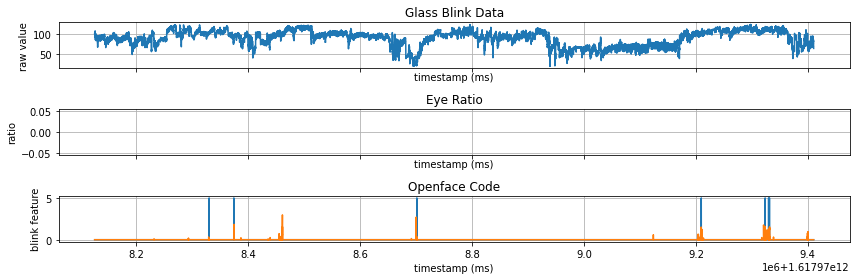

BLINK SESSION 1


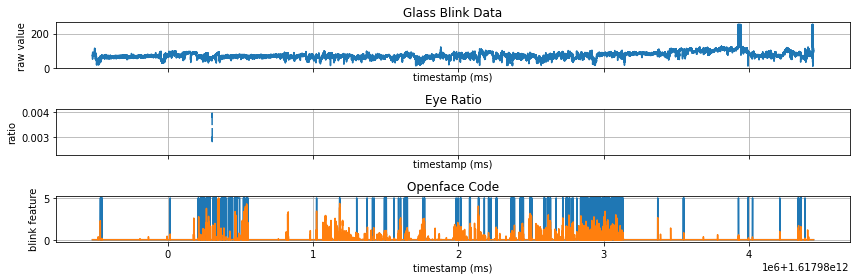

BLINK SESSION 2


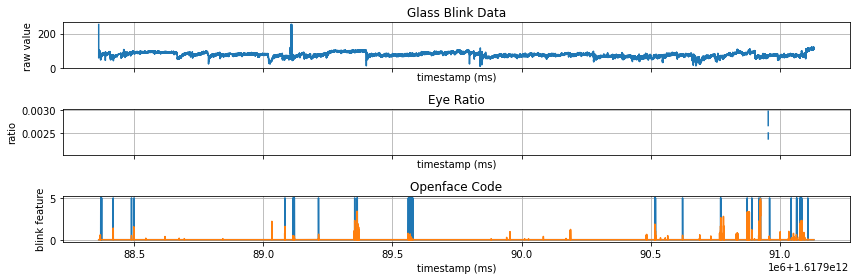

BLINK SESSION 3


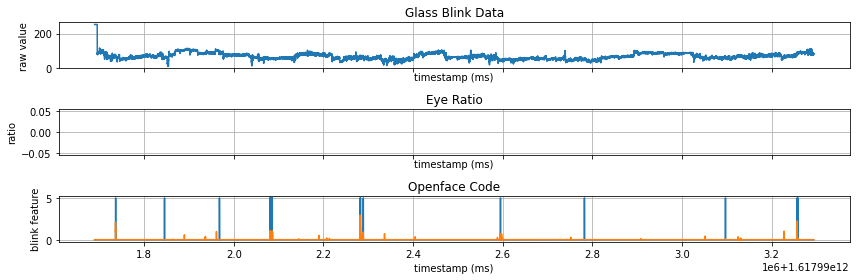

BLINK SESSION 4


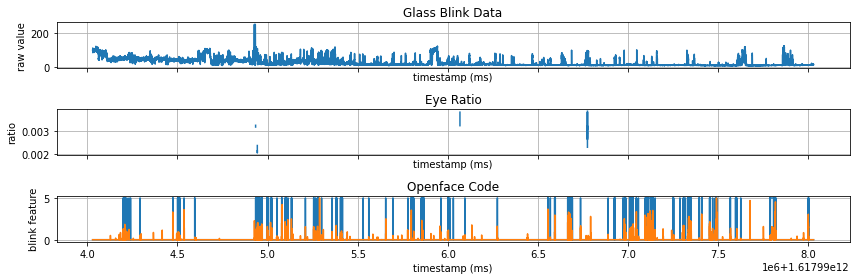

In [10]:
for sess_num in range(len(blink_sess)):
    print('BLINK SESSION', sess_num)
    plot_session(blink_sess[sess_num], df_vid, plot_type='blink')

ACCEL SESSION 0


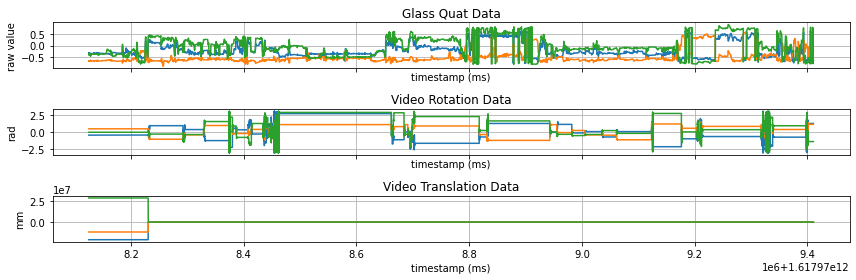

ACCEL SESSION 1


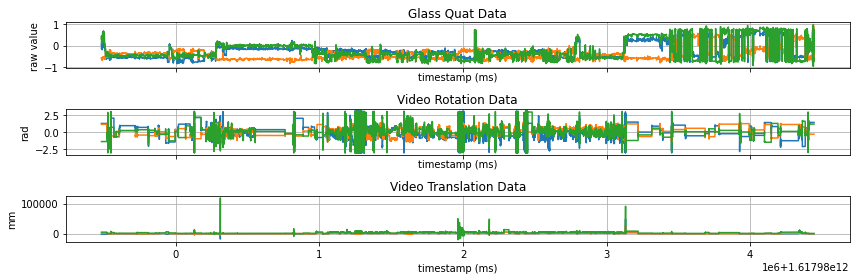

ACCEL SESSION 2


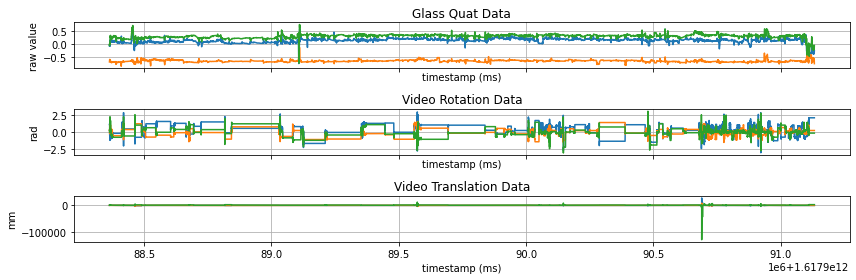

ACCEL SESSION 3


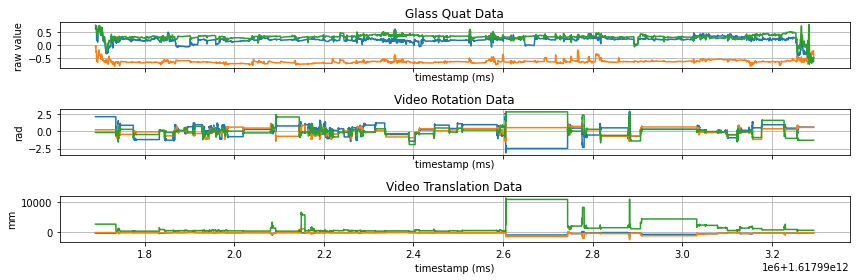

ACCEL SESSION 4


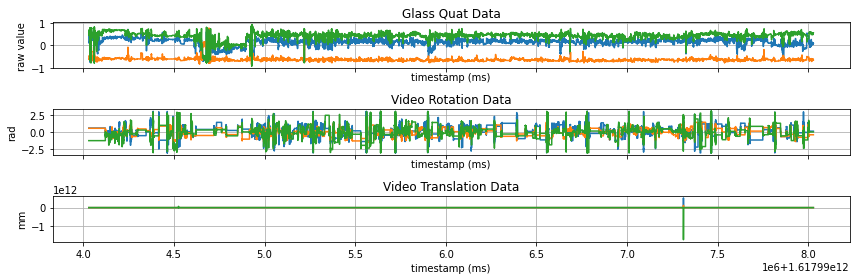

In [11]:
for sess_num in range(len(accel_sess)):
    print('ACCEL SESSION', sess_num)
    plot_session(accel_sess[sess_num], df_vid, plot_type='accel')

CONFIDENCE SESSION 0


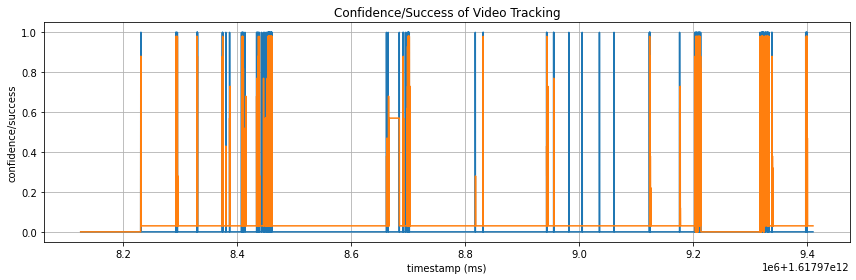

CONFIDENCE SESSION 1


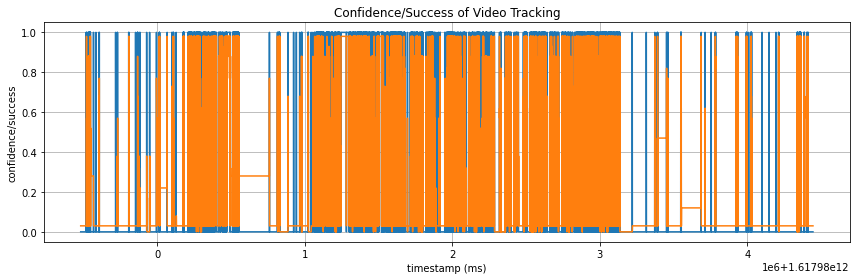

CONFIDENCE SESSION 2


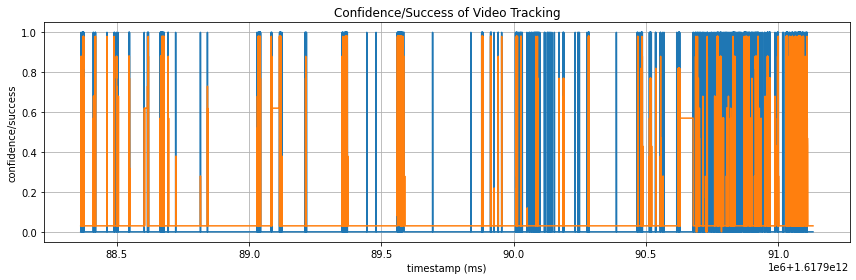

CONFIDENCE SESSION 3


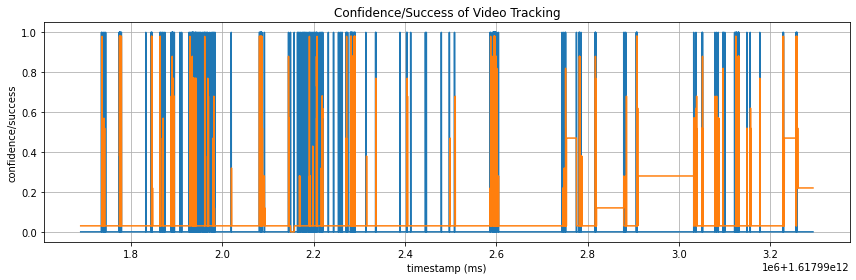

CONFIDENCE SESSION 4


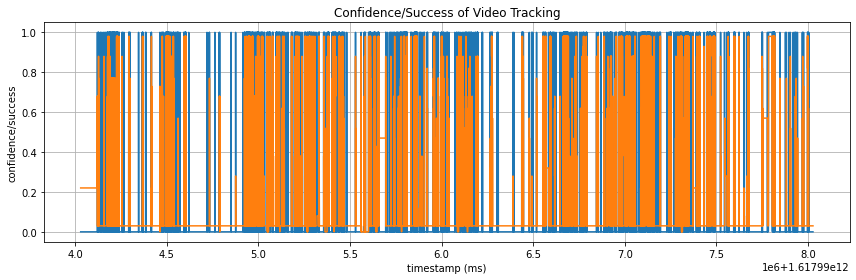

In [12]:
for sess_num in range(len(accel_sess)):
    print('CONFIDENCE SESSION', sess_num)
    plot_session(accel_sess[sess_num], df_vid, plot_type='confidence')

## Better Time Alignment

We need to compare signals from the video feed (60Hz) and our Blink Data (1kHz) and Accelerometer data (10Hz).

We're also not totally guaranteed that the times are aligned perfectly, which we've stored our estimate of max error (in seconds) in `s_meta['start_error_sec']`.  To do a good comparison we need to transform the data into comparable timesteps/units and cross correlate them to find a minimum error in signal via time.

---

We'll start by selecting a small range where we have good continuous blink data from openface (AU45_c) and blink data from the glasses.  

We'll upsample our data to 3kHz with zeros in between (the lowest common multiple of our sample rates), and run our cross correlation over this match.  Based on this, we can move our 60Hz signal to the nearest correct 1/3 ms.  This alignment should hold for the whole video, no matter what processing we're doing.

---

when running the below for the first time, pick a blink session above that has good data, and play with the offset/duration so that we capture a section that has good video data.  We can use `check_xcorr_selection` below to dial in the choice of section that will be run through the xcorr.  Once we've done this and run the `apply_xcorr_timecorrect` function, it will save the offset in a pickle that will always be used for that participant.

In [13]:
def string_to_timestamp_ms(datestring):
    return datetime.strptime(datestring, '%m/%d/%y %I:%M:%S%p %Z').timestamp()*1000

def timestamp_ms_to_string(timestamp):
    local_tz = datetime.now().astimezone().tzinfo
    return datetime.fromtimestamp(timestamp/1000, tz=local_tz).strftime('%m/%d/%y %I:%M:%S%p %Z')

def check_xcorr_selection(blink_session, df_vid, max_err_sec, offset_sec=5*60, xcorr_dur_sec=60*5):
    print('passed session extends from', timestamp_ms_to_string(blink_session['timestamp_ms'].iloc[0]), 
                                   'to', timestamp_ms_to_string(blink_session['timestamp_ms'].iloc[-1]))
    
    print(' video session extends from', s_meta['vid_start'], 'to',
          timestamp_ms_to_string(string_to_timestamp_ms(s_meta['vid_start']) + s_meta['vid_duration_sec']*1000))
    
    print('-'*20)
    
    shared_starttimestamp_ms = max(blink_session['timestamp_ms'].iloc[0], string_to_timestamp_ms(s_meta['vid_start']))
    shared_endtimestamp_ms = min(blink_session['timestamp_ms'].iloc[-1], string_to_timestamp_ms(s_meta['vid_start']) + s_meta['vid_duration_sec']*1000)
    shared_duration_ms = shared_endtimestamp_ms - shared_starttimestamp_ms
    
    print('together we extend from ', timestamp_ms_to_string(shared_starttimestamp_ms), 
                                  'to', timestamp_ms_to_string(shared_endtimestamp_ms))
    print('shared duration = %.1f min' % (shared_duration_ms / 60000))
    
    print('-'*20)
    
    assert (shared_duration_ms / 1000) > offset_sec + xcorr_dur_sec + 2*max_err_sec, 'not enough overlap to test!'
    
    start_timestamp_glasses = shared_starttimestamp_ms + (offset_sec*1000) + (max_err_sec*1000)
    end_timestamp_glasses = start_timestamp_glasses + (xcorr_dur_sec*1000) 
    
    start_timestamp_vid = start_timestamp_glasses - (max_err_sec*1000) 
    end_timestamp_vid = end_timestamp_glasses + (max_err_sec*1000)
    
    df_b = df_between_timestamps(blink_session, 'timestamp_ms', start_timestamp_glasses, end_timestamp_glasses)
    df_v = df_between_timestamps(df_vid, 'est_timestamp_ms', start_timestamp_vid, end_timestamp_vid)
    
    print('using glasses data from', timestamp_ms_to_string(df_b['timestamp_ms'].iloc[0]), 
                               'to', timestamp_ms_to_string(df_b['timestamp_ms'].iloc[-1]),
                               '(%.1f' % ((df_b['timestamp_ms'].iloc[-1]-df_b['timestamp_ms'].iloc[0])/60000),'min)')
    
    print('using   video data from', timestamp_ms_to_string(df_v['est_timestamp_ms'].iloc[0]),
                               'to', timestamp_ms_to_string(df_v['est_timestamp_ms'].iloc[-1]),
                               '(%.1f' % ((df_v['est_timestamp_ms'].iloc[-1]-df_v['est_timestamp_ms'].iloc[0])/60000),'min)')
    
    print('-'*20)
    print('we will sweep the AU45 video signal over the glasses data:')
    
    fig, ax = plt.subplots(figsize=(16,6))
    ax.plot(df_v['est_timestamp_ms'], df_v['AU45_r']/max(df_v['AU45_r']))
    ax.plot(df_b['timestamp_ms'], (df_b['value']-min(df_b['value']))/(max(df_b['value'])-min(df_b['value'])))
    plt.show()
    
    
def xcorr_timecorrect(blink_session, df_vid, max_err_sec, offset_sec=5*60, xcorr_dur_sec=60*5):
    
    print('passed session extends from', timestamp_ms_to_string(blink_session['timestamp_ms'].iloc[0]), 
                                   'to', timestamp_ms_to_string(blink_session['timestamp_ms'].iloc[-1]))
    
    print(' video session extends from', s_meta['vid_start'], 'to',
          timestamp_ms_to_string(string_to_timestamp_ms(s_meta['vid_start']) + s_meta['vid_duration_sec']*1000))
    
    print('-'*20)
    
    shared_starttimestamp_ms = max(blink_session['timestamp_ms'].iloc[0], string_to_timestamp_ms(s_meta['vid_start']))
    shared_endtimestamp_ms = min(blink_session['timestamp_ms'].iloc[-1], string_to_timestamp_ms(s_meta['vid_start']) + s_meta['vid_duration_sec']*1000)
    shared_duration_ms = shared_endtimestamp_ms - shared_starttimestamp_ms
    
    print('together we extend from ', timestamp_ms_to_string(shared_starttimestamp_ms), 
                                  'to', timestamp_ms_to_string(shared_endtimestamp_ms))
    print('shared duration = %.1f min' % (shared_duration_ms / 60000))
    
    print('-'*20)
    
    assert (shared_duration_ms / 1000) > offset_sec + xcorr_dur_sec + 2*max_err_sec, 'not enough overlap to test!'
    
    start_timestamp_glasses = shared_starttimestamp_ms + (offset_sec*1000) + (max_err_sec*1000)
    end_timestamp_glasses = start_timestamp_glasses + (xcorr_dur_sec*1000) 
    
    start_timestamp_vid = start_timestamp_glasses - (max_err_sec*1000) 
    end_timestamp_vid = end_timestamp_glasses + (max_err_sec*1000)
    
    df_b = df_between_timestamps(blink_session, 'timestamp_ms', start_timestamp_glasses, end_timestamp_glasses)
    df_v = df_between_timestamps(df_vid, 'est_timestamp_ms', start_timestamp_vid, end_timestamp_vid)
    
    print('using glasses data from', timestamp_ms_to_string(df_b['timestamp_ms'].iloc[0]), 
                               'to', timestamp_ms_to_string(df_b['timestamp_ms'].iloc[-1]),
                               '(%.1f' % ((df_b['timestamp_ms'].iloc[-1]-df_b['timestamp_ms'].iloc[0])/60000),'min)')
    
    print('using   video data from', timestamp_ms_to_string(df_v['est_timestamp_ms'].iloc[0]),
                               'to', timestamp_ms_to_string(df_v['est_timestamp_ms'].iloc[-1]),
                               '(%.1f' % ((df_v['est_timestamp_ms'].iloc[-1]-df_v['est_timestamp_ms'].iloc[0])/60000),'min)')
    
    print('-'*20)
    print('we will sweep the AU45 video signal over the glasses data:')
    
    fig, ax = plt.subplots(figsize=(16,6))
    ax.plot(df_v['est_timestamp_ms'], df_v['AU45_r']/max(df_v['AU45_r']))
    ax.plot(df_b['timestamp_ms'], (df_b['value']-min(df_b['value']))/(max(df_b['value'])-min(df_b['value'])))
    plt.show()
    
    #normalize and UPSAMPLE! upsample blink data by 3x and openface data by 50x
    #we invert the blink data because we normally expect a lower signal on blinks
    blink_up = np.zeros(len(df_b)*3)
    blink_up[::3] = 1 - (df_b['value']-min(df_b['value']))/(max(df_b['value'])-min(df_b['value']))
    blink_t0 = df_b['timestamp_ms'].iloc[0]
    
    vid_up = np.zeros(len(df_v)*50)
    vid_up[::50] = df_v['AU45_r']/max(df_v['AU45_r'])
    vid_t0 = df_v['est_timestamp_ms'].iloc[0]
    
    #now we'll xcorr these two numpy arrays; blink_up slides across vid_up where there it
    #can totally be overlapped.  A lag of 0 assumes blink_t0=vid_t0.  We expect a length
    #here of len(video)-len(blinkarray) as we slide, so err_sec*3k points.  Heavy computation.
    #pycorrelate is used because it is designed to only compute xcorr where overlap is >= minsize(x,y)-1
    xcorr = pycorrelate.ucorrelate(blink_up, vid_up, maxlag=len(vid_up)-len(blink_up))
    
    print('vidlen=',len(vid_up),'blinklen=',len(blink_up),'xcorrlen=',len(xcorr))
    fig, ax = plt.subplots(figsize=(16,6))
    ax.plot(xcorr)
    plt.title('xcorr at 3kHz')
    plt.show()
    
    #pull out the index (and ms delay) of the blink signal to get a perfect match
    index_max_xcorr = np.argmax(np.abs(xcorr))
    index_ms = index_max_xcorr / 3.
    
    #difference to add to gopro timestamps to make them time-aligned
    difference = index_ms - (blink_t0 - vid_t0) 
    
    print('blink aligns with offset',index_max_xcorr,'or',index_ms,'ms.',
          'We originally had a difference between start times of', (blink_t0-vid_t0),
          '.That\'s', difference, 'ms to add to video files')
    
    return difference
    

def apply_xcorr_timecorrect(blink_session, df_vid, max_err_sec, offset_sec=5*60, xcorr_dur_sec=60*5, overwrite=False):
    #if overwrite=False, try to load xcorr ms offset from pickle.  If that fails or overwrite=True, generate a new
    #one and save it to disk.  In either case, we apply the xcorr offset to the video df 'est_timestamp_ms' column
    #to get a corrected 'timestamp_ms' column and return a new df_vid with corrected timestamps.
    #offset_sec is how many seconds from the start of the video we start our xcorr, and size of xcorr is xcorr_dur_sec
    
    if not overwrite:
        try:
            difference = pickle.load(open('./cleaned_data/' + SESSION + '/xcorr_offset_ms.p', 'rb'))
            print('loaded existing xcorr_offset, applying difference of', difference, 'ms to our video dataframe.')
            df_vid['timestamp_ms'] = df_vid['est_timestamp_ms'].apply(lambda v: int(v + difference))
            return df_vid
        except:
            print('Failed to find existing xcorr on disk!')
    
    print('Generating new xcorr...')
    difference = xcorr_timecorrect(blink_session, df_vid, max_err_sec, offset_sec, xcorr_dur_sec)
    print('saving to file ./cleaned_data/' + SESSION + '/xcorr_offset_ms.p')
    pickle.dump(difference, open( './cleaned_data/' + SESSION + '/xcorr_offset_ms.p', "wb" ))
    
    df_vid['timestamp_ms'] = df_vid['est_timestamp_ms'].apply(lambda v: int(v + difference))
    return df_vid
    
        
def plot_blinkcompare(df_sess, df_vid, vid_timestamp='est_timestamp_ms', secs=None, last=False):
    #print 'secs' of data from beginning (last=True) or end (last=True) of session
    
    shared_starttimestamp_ms = max(df_sess['timestamp_ms'].iloc[0], df_vid[vid_timestamp].iloc[0])
    shared_endtimestamp_ms = min(df_sess['timestamp_ms'].iloc[-1], df_vid[vid_timestamp].iloc[-1])
        
    if secs is not None:
        if last:
            shared_starttimestamp_ms = max(shared_starttimestamp_ms, shared_endtimestamp_ms - secs*1000)
        else:
            shared_endtimestamp_ms = min(shared_endtimestamp_ms, shared_starttimestamp_ms + secs*1000)
    
    df_sess = df_between_timestamps(df_sess, 'timestamp_ms', shared_starttimestamp_ms, shared_endtimestamp_ms)
    df_vid = df_between_timestamps(df_vid, vid_timestamp, shared_starttimestamp_ms, shared_endtimestamp_ms) 

    fig, ax = plt.subplots(figsize=(16,4))

    ax.plot(df_vid[vid_timestamp], df_vid['AU45_c']/max(df_vid['AU45_c']))
    ax.plot(df_vid[vid_timestamp], df_vid['AU45_r']/max(df_vid['AU45_r']))
    ax.plot(df_sess['timestamp_ms'], df_sess['value']/max(df_sess['value']))
    ax.set(xlabel='timestamp (ms)', ylabel='raw value', title='Glass Blink Data')
    ax.grid()
    
    fig.tight_layout()
    plt.show()                                         

what we should actually correlate (1) takes into account zeros in video (np.nan?) don't want to normalize by length that inclues those if we just haven't tracked well.  Turns out the data is really full of holes.  Hopefully we don't need to do this by hand and just replacing them with nans will do it, need to check the documentation. and (2) we should really use the inverted 1st derivative after LPF for the blink data, which is the signal that most accurately corresponds to the raw blink signal.

Use this function to find a good session and offset that has reasonable data to xcorr, and then pass these parameters to the xcorr function in the next cell.

passed session extends from 04/09/21 10:44:42AM EDT to 04/09/21 12:07:24PM EDT
 video session extends from 04/09/21 10:21:33AM EDT to 04/09/21 04:19:53PM EDT
--------------------
together we extend from  04/09/21 10:44:42AM EDT to 04/09/21 12:07:24PM EDT
shared duration = 82.7 min
--------------------
using glasses data from 04/09/21 11:40:57AM EDT to 04/09/21 11:44:57AM EDT (4.0 min)
using   video data from 04/09/21 11:40:42AM EDT to 04/09/21 11:45:12AM EDT (4.5 min)
--------------------
we will sweep the AU45 video signal over the glasses data:


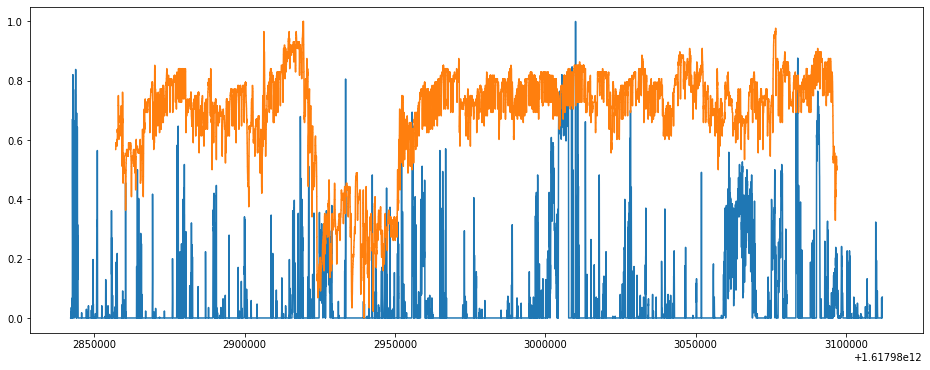

In [35]:
check_xcorr_selection(blink_sess[1], df_vid, s_meta['start_error_sec'], offset_sec=56*60, xcorr_dur_sec=60*1)

This XCORR is extremely slow, so we only want to calculate it once and then save it

Generating new xcorr...
passed session extends from 04/09/21 10:44:42AM EDT to 04/09/21 12:07:24PM EDT
 video session extends from 04/09/21 10:21:33AM EDT to 04/09/21 04:19:53PM EDT
--------------------
together we extend from  04/09/21 10:44:42AM EDT to 04/09/21 12:07:24PM EDT
shared duration = 82.7 min
--------------------
using glasses data from 04/09/21 11:40:57AM EDT to 04/09/21 11:44:57AM EDT (4.0 min)
using   video data from 04/09/21 11:40:42AM EDT to 04/09/21 11:45:12AM EDT (4.5 min)
--------------------
we will sweep the AU45 video signal over the glasses data:


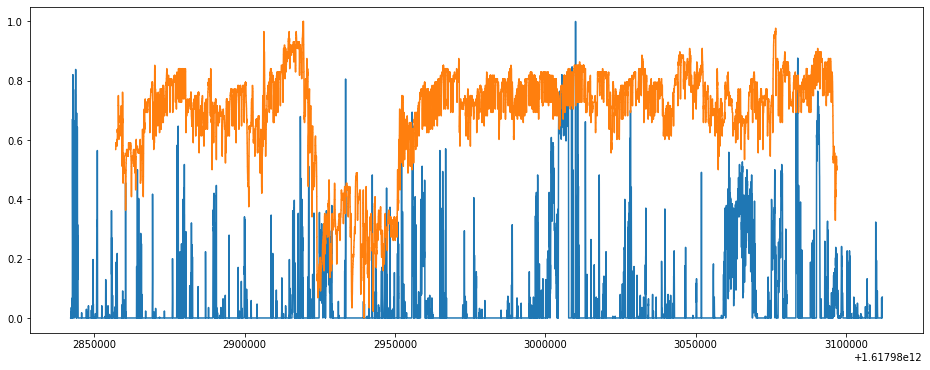

vidlen= 809200 blinklen= 708003 xcorrlen= 101197


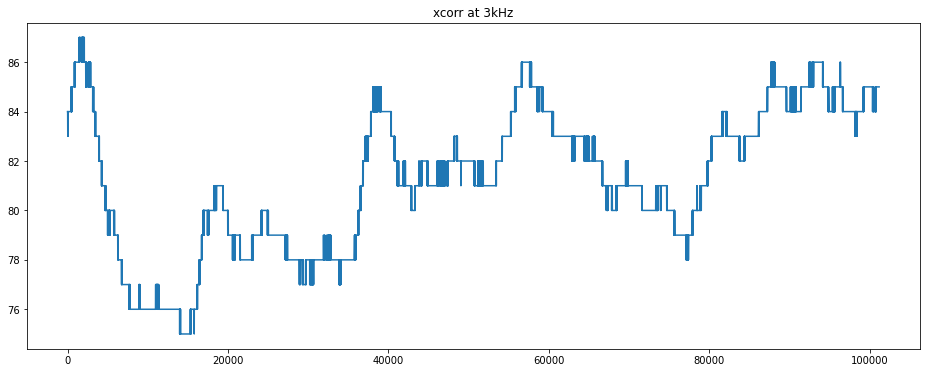

blink aligns with offset 1439 or 479.6666666666667 ms. We originally had a difference between start times of 14991 .That's -14511.333333333334 ms to add to video files
saving to file ./cleaned_data/juliana_1/xcorr_offset_ms.p
Before Time Align


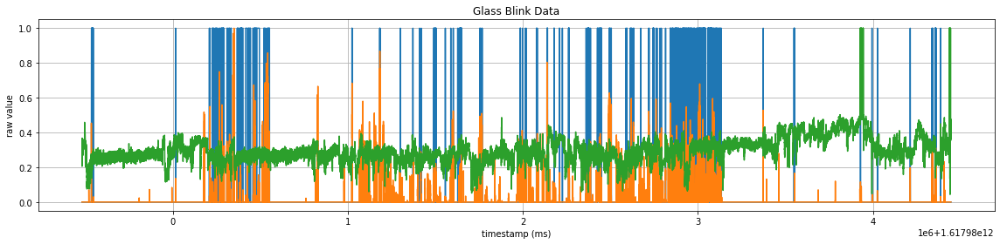

After Time Align


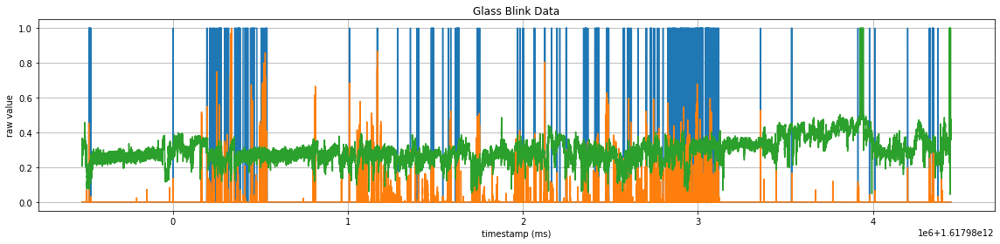

In [37]:
new_df_vid = apply_xcorr_timecorrect(blink_sess[1], df_vid, s_meta['start_error_sec'], offset_sec=56*60, xcorr_dur_sec=60*4, overwrite=True)
    
print('Before Time Align')
plot_blinkcompare(blink_sess[1], new_df_vid, 'est_timestamp_ms')
print('After Time Align')
plot_blinkcompare(blink_sess[1], new_df_vid, 'timestamp_ms')

## Divide Video into Sessions
It turns out our face extraction from open face doesn't actually work that well, and is pretty spotty.

To better assess how well we're doing with blinks, we need to chop the video data into usable sessions as well-- we'll pull sections where there are contiguous chunks of 'successful' tracking on the faces (with a minimum useful chunk of 200ms by default, and where we tolerate up to 2 consecutive dropped frames that we can interpolate).

We'll use these sections for all future analysis.


In [88]:
# Chop the video into useful sections based on success metric
def print_summary(df_vid, thresh=0.3):
    old_len = len(df_vid)
    df_vids = len(df_vid[df_vid['success'] == 1])
    print('Have',df_vids, 'frames considered successful, (%2.2f%%)' % (100.*df_vids/old_len))    
    df_vidc = len(df_vid[df_vid['confidence'] >= thresh])
    print('Have',df_vidc, 'frames above thresh of',thresh,'(%2.2f%%)' % (100.*df_vidc/old_len))
    
    return old_len, df_vids

def get_sessions_by_success(df_vid, min_sess_sec=0.2, tolerate_n_dropped_frames=2):
    sessions = []
    min_sess_len = min_sess_sec * 60 #samples in min_sess_sec is FPS*sec
    prev_tick = 0
    curr_sess = pd.DataFrame()
    
    old_len = len(df_vid)
    df_vid = df_vid[df_vid['success'] == 1]
    print('Have',len(df_vid), 'frames considered successful, (%2.2f%%)' % (100.*len(df_vid)/old_len))
    
    #iterate over dataframe only where rows have success == 1
    for i, row in df_vid.iterrows():
        #when we skip a row because tracking failed, append current session
        #if it's long enough and start a new session over
        if row['tick_ms'] > (prev_tick + 24.5 + tolerate_n_dropped_frames*100/6.):
            if len(curr_sess) > min_sess_len:
                sessions.append(curr_sess)
            curr_sess = pd.DataFrame()
        
        curr_sess = curr_sess.append(row)
        prev_tick = row['tick_ms']        
        
    if len(curr_sess) > min_sess_len: sessions.append(curr_sess)
    
    return sessions


def get_sessions_by_confidence(df_vid, min_sess_sec=0.2, thresh=0.3, tolerate_n_dropped_frames=2):
    sessions = []
    min_sess_len = min_sess_sec * 60 #samples in min_sess_sec is FPS*sec
    prev_tick = 0
    curr_sess = pd.DataFrame()
    
    old_len = len(df_vid)
    df_vid = df_vid[df_vid['confidence'] >= thresh]
    print('Have',len(df_vid), 'frames above thresh of',thresh,'(%2.2f%%)' % (100.*len(df_vid)/old_len))
    
    
    #iterate over dataframe only where rows have success == 1
    for i, row in df_vid.iterrows():
        #when we skip a row because tracking failed, append current session
        #if it's long enough and start a new session over
        if row['tick_ms'] > (prev_tick + 24.5 + tolerate_n_dropped_frames*100/6.):
            if len(curr_sess) >= min_sess_len:
                sessions.append(curr_sess)
            curr_sess = pd.DataFrame()
        
        curr_sess = curr_sess.append(row)
        prev_tick = row['tick_ms']        
        
    if len(curr_sess) > min_sess_len: sessions.append(curr_sess)
    
    return sessions
 

In [95]:
MIN_SEC_SESSION = 0.2
DROP_FRAMES = 2

print_summary(new_df_vid)
print('-'*20)
print('USING SUCCESSFUL BY OPENFACE STANDARD')
print('-'*20)
vid_sess = get_sessions_by_success(new_df_vid, 
                                   min_sess_sec=MIN_SEC_SESSION, 
                                   tolerate_n_dropped_frames=DROP_FRAMES)

print('found',len(vid_sess),'sessions.')

#vid_sess_c = get_sessions_by_confidence(new_df_vid)
#print('found',len(vid_sess_c),'sessions.')

Have 73566 frames considered successful, (5.71%)
Have 111996 frames above thresh of 0.3 (8.69%)
--------------------
USING SUCCESSFUL BY OPENFACE STANDARD
--------------------
Have 73566 frames considered successful, (5.71%)


KeyboardInterrupt: 

Let's check what our blink data looks like in the small chunks where we have reliable data

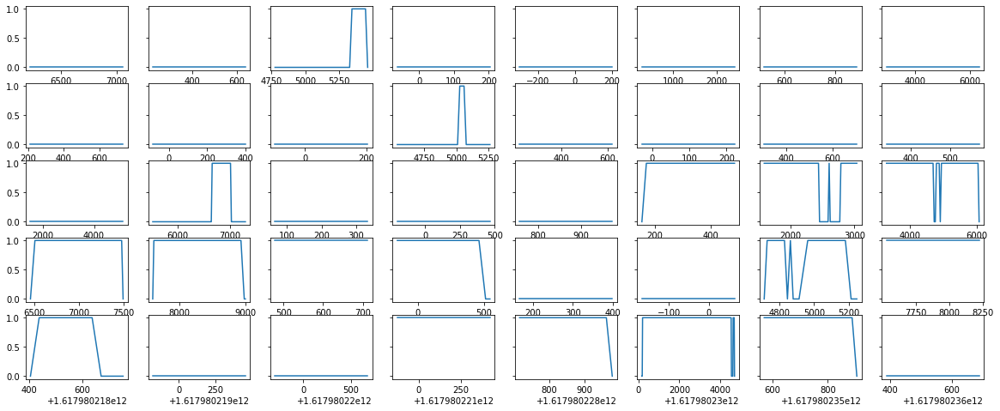

In [91]:
def plot_vid_sess(vid_sess, startind=0):
    fig, ax = plt.subplots(nrows=5, ncols=8, sharey=True, figsize=(20,8))
    ax = ax.flatten()
    for p, i in enumerate(range(startind, startind+40)):
        ax[p].plot(vid_sess[i%len(vid_sess)]['timestamp_ms'],vid_sess[i%len(vid_sess)]['AU45_c'])
    plt.show()
    
plot_vid_sess(vid_sess)

#### Save the data

Given our time aligned video data and our chunks of reasonable tracking, we can save some metadata about what chunks we have and how many blinks we detect in each chunk.  This is what we'll use for ground truth.

In [124]:
def count_rising_edges(sess, column):
    #assuming a 1/0 signal, counts transitions to 1.  Starting at 1
    #counts as a transition.
    prev_row, count = 0, 0
    for i,row in sess.iterrows():
        if row[column] == 1 and prev_row == 0: count += 1
        prev_row = row[column]    
    return count

def count_rising_edges_list(values):
    #assuming a 1/0 signal, counts transitions to 1.  Starting at 1
    #counts as a transition.
    prev_row, count = 0, 0
    for v in values:
        if v == 1 and prev_row == 0: count += 1
        prev_row = v    
    return count

def rising_edge_times(sess, column, timecolumn):
    #assuming a 1/0 signal, returns transition times. Starting at 1
    #counts as a transition.
    prev_row, transitions = 0, []
    for i,row in sess.iterrows():
        if row[column] == 1 and prev_row == 0: 
            transitions.append(row[timecolumn])
        prev_row = row[column]    
    return transitions

In [109]:
total, successful = print_summary(df_vid, thresh=0.3)

vid_meta_data = {}
vid_meta_data['total_frames'] = total
vid_meta_data['successful_frames'] = successful
vid_meta_data['percent_successful'] = 100.*successful/total
vid_meta_data['total_duration_sec'] = total/60.
vid_meta_data['session_min_sec'] = MIN_SEC_SESSION
vid_meta_data['session_drop_frames'] = DROP_FRAMES
vid_meta_data['num_sessions'] = len(vid_sess)
vid_meta_data['session_times'] = [[s['timestamp_ms'].iloc[0], s['timestamp_ms'].iloc[-1]] for s in vid_sess]
vid_meta_data['duration_sessions_sec'] = [(s['timestamp_ms'].iloc[-1] - s['timestamp_ms'].iloc[0])/1000. for s in vid_sess]
vid_meta_data['session_total_sec'] = sum(vid_meta_data['duration_sessions_sec'])
vid_meta_data['blinks_per_session'] = [count_rising_edges(s, 'AU45_c') for s in vid_sess]
vid_meta_data['blink_timestamps_per_session'] = [rising_edge_times(s, 'AU45_c', 'timestamp_ms') for s in vid_sess]
vid_meta_data['total_blinks'] = sum(vid_meta_data['blinks_per_session'])
vid_meta_data['blinks_per_sec'] = vid_meta_data['total_blinks'] / vid_meta_data['session_total_sec']

print('Measured', vid_meta_data['total_blinks'], 'blinks.  That gives %.2f blinks/min' % (60.*vid_meta_data['blinks_per_sec']))

pickle.dump(vid_meta_data, open( './cleaned_data/' + SESSION + '/video_blink_sessions.p', "wb" ))

Have 73566 frames considered successful, (5.71%)
Have 111996 frames above thresh of 0.3 (8.69%)
Measured 849 blinks.  That gives 45.88 blinks/min


## Blink Analysis and Comparison

From our 'ground truth' data above, we have taken the chunks that were 'highly confident' from openface and we've calculated a 'trustworthy' blink rate for this participant (num of confident detected blinks / the duration of confident video).  Using this, we know roughly how many blinks we should expect to capture when we tune our algorithm for blink detection.

We'll apply an algorithm for blink detection, and then run the same rising edge capture script to compare it against all of the short sessions we found in vid_meta_data above.

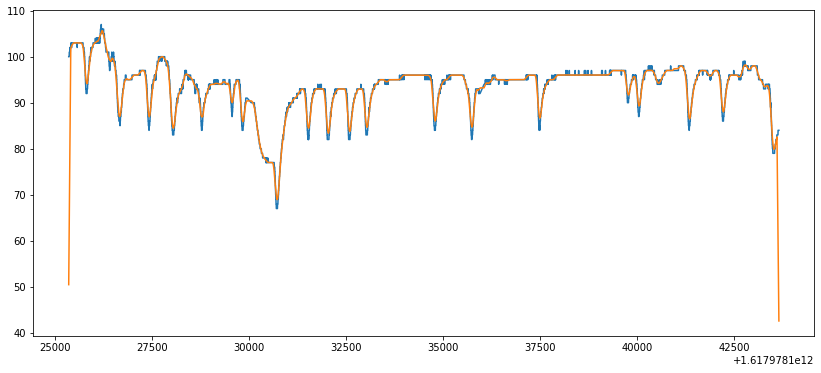

In [294]:
#now for each blink session, generate a 'blink 1/0' column based 
#on a rolling average of n samples, assume blinks are ~100 ms events,

def blink_thresh(blink_sess, reverse=False, rolling_avg_smpl=500, thresh=20, debounce=5, blink_dur_smpl=100):
    #reverse to capture upward signal as blink
    
    #rolling avg + thresh is thresh for triggering a blink, must be above thresh for debounce
    #to trigger blink.  Blink will last for blink_dur_samples and ignore incoming data at that point
    #samples during blink don't contribute to rolling avg.  Signal itself is not LPF.

    #FIFO buffer for rolling average; start full of average of session
    rolling_avg = collections.deque(maxlen=rolling_avg_smpl)
    rolling_avg.extend(np.ones(rolling_avg_smpl)*blink_sess['value'].mean())
    
    blink_signal = []
    debounce_count = 0
    blinking = False
    for i, row in blink_sess.iterrows():
        if not debounce_count and not blinking: 
            if  (row['value'] < (np.mean(rolling_avg) - thresh) and not reverse) or \
            (row['value'] > (np.mean(rolling_avg) + thresh) and reverse):
                #starting to blink
                debounce_count = 1
                temp_blink_vals = [row['value']]
            else:
                #not blinking
                rolling_avg.append(row['value'])
                blink_signal.append(0)
        elif not blinking:
            debounce_count += 1
            if  (row['value'] < (np.mean(rolling_avg) - thresh) and not reverse) or \
            (row['value'] > (np.mean(rolling_avg) + thresh) and reverse):
                #beginning of blink, checking for debounce
                temp_blink_vals.append(row['value'])
                if debounce_count > debounce: blinking = True
            else:
                #not blinking
                rolling_avg.extend(temp_blink_vals)
                blink_signal.extend(np.zeros(debounce_count))
                debounce_count = 0
        else: #blinking, ignore samples for duration of blink
            debounce_count += 1
            if debounce_count >= blink_dur_smpl:
                blink_signal.extend(np.ones(debounce_count))
                debounce_count = 0
                blinking = False
    blink_signal.extend(np.zeros(debounce_count))
    return blink_signal


def blink_thresh_LPF(blink_sess, reverse=False, rolling_avg_smpl=50, thresh=20):
    #reverse to capture upward signal as blink
    
    #simple rolling average, if avg + thresh then trigger blink.  This value is
    #ignored for the rolling average.  Signal itself is not LPF.
    
    rolling_avg = collections.deque(maxlen=rolling_avg_smpl)
    rolling_avg.extend(np.ones(rolling_avg_smpl)*blink_sess['value'].mean())
    
    blink_signal = []
    for i, row in blink_sess.iterrows():
        if (row['value'] < (np.mean(rolling_avg) - thresh) and not reverse) or \
           (row['value'] > (np.mean(rolling_avg) + thresh) and reverse):
            blink_signal.append(1)
        else:
            blink_signal.append(0)
            rolling_avg.append(row['value'])
            
    return blink_signal


def blink_thresh_LPF_nonrealtime(blink_sess, reverse=False, incoming_lpf_smpl=100, rolling_avg_smpl=100, thresh=20):
    #reverse to capture upward signal as blink
    
    #same as above, but signal itself is rolling averaged (LPFed)-- this will add actual delay 
    #in real life implementation, but should probably work better.
    
    def moving_average(x, w):
        return np.convolve(x, np.ones(w), 'same') / w
    
    filtered_blink = moving_average(blink_sess['value'].tolist(), incoming_lpf_smpl)
    rolling_avg = collections.deque(maxlen=rolling_avg_smpl)
    rolling_avg.extend(np.ones(rolling_avg_smpl)*blink_sess['value'].mean())
    
    blink_signal = []
    for v in filtered_blink:
        if (v < (np.mean(rolling_avg) - thresh) and not reverse) or \
           (v > (np.mean(rolling_avg) + thresh) and reverse):
            blink_signal.append(1)
        else:
            blink_signal.append(0)
            rolling_avg.append(v)
            
    return blink_signal


def plot_LPF_smpl(sess, smpl=100, test_sess_max_dur_min=5):
    
    try:
        test_sess = sess.iloc[:60*60*test_sess_max_dur_min]
    except:
        test_sess = sess
        
    def moving_average(x, w):
        return np.convolve(x, np.ones(w), 'same') / w
    
    filtered_blink = moving_average(test_sess['value'].tolist(), smpl)
    
    fig, ax = plt.subplots(figsize=(14,6))
    ax.plot(test_sess['timestamp_ms'], test_sess['value'])
    ax.plot(test_sess['timestamp_ms'], filtered_blink)
    plt.show()
    

plot_LPF_smpl(blink_sess[0])
#blink_thresh takes these parameters:
# reverse=False (assume dips are blinks)
# rolling_avg_smpl=500 (rolling average of baseline point in samples)
# thresh=20 (threshold above baseline to trigger blink)
# debounce=5 (consecutive # above threshold to trigger blink in samples)
# blink_dur_smpl=100 (# samples to ignore once we have a blink and assume they are part of the blink; they don't count to the running average)


In [139]:
def test_params_blink_thresh(sess, 
                             test_sess_max_dur_min=10,
                             rolling_avgs = [10, 100, 500, 1000],
                             threshs = [5, 10, 20, 50],
                             debounce = [2, 5, 15, 25],
                             blink_dur_smpl= [20, 40, 50, 100],
                             plot_all=False):

    try:
        test_sess = sess.iloc[:60*60*test_sess_max_dur_min]
    except:
        test_sess = sess
        
    sess_dur = test_sess['timestamp_ms'].iloc[-1] - test_sess['timestamp_ms'].iloc[0]
    sess_dur /= 1000.
    target = sess_dur * vid_meta_data['blinks_per_sec']
    print('='*20)
    print('session is', sess_dur, 'sec, so we expect',target,'blinks.')
    print('='*20)
    
    for r,t,d,b in itertools.product(rolling_avgs, threshs, debounce, blink_dur_smpl):
        blink_sig = blink_thresh(test_sess, rolling_avg_smpl=r, thresh=t, debounce=d, blink_dur_smpl=b)
        print(r,t,d,b,':',count_rising_edges_list(blink_sig))
        if plot_all:
            plt.plot(blink_sess[sess_num]['timestamp_ms'],blink_sess[sess_num]['value']/np.max(blink_sess[sess_num]['value']))
            plt.plot(blink_sess[sess_num]['timestamp_ms'],blink_sig)
            plt.show()

test_params_blink_thresh(blink_sess[0])

#expect 42
# 100 5 25 100 : 62
# 500 5 25 100 : 57
# 1000 5 5 100 : 47
# 500 10 2 20 : 20
# 1000 10 2 20 : 21

session is 54.799 sec, so we expect 41.90137256491316 blinks.
10 5 2 20 : 1
10 5 2 40 : 1
10 5 2 50 : 1
10 5 2 100 : 1
10 5 5 20 : 1
10 5 5 40 : 1
10 5 5 50 : 1
10 5 5 100 : 1
10 5 15 20 : 1
10 5 15 40 : 1
10 5 15 50 : 1
10 5 15 100 : 1
10 5 25 20 : 1
10 5 25 40 : 1
10 5 25 50 : 1
10 5 25 100 : 1
10 10 2 20 : 0
10 10 2 40 : 0
10 10 2 50 : 0
10 10 2 100 : 0
10 10 5 20 : 0
10 10 5 40 : 0
10 10 5 50 : 0
10 10 5 100 : 0
10 10 15 20 : 0
10 10 15 40 : 0
10 10 15 50 : 0
10 10 15 100 : 0
10 10 25 20 : 0
10 10 25 40 : 0
10 10 25 50 : 0
10 10 25 100 : 0
10 20 2 20 : 0
10 20 2 40 : 0
10 20 2 50 : 0
10 20 2 100 : 0
10 20 5 20 : 0
10 20 5 40 : 0
10 20 5 50 : 0
10 20 5 100 : 0
10 20 15 20 : 0
10 20 15 40 : 0
10 20 15 50 : 0
10 20 15 100 : 0
10 20 25 20 : 0
10 20 25 40 : 0
10 20 25 50 : 0
10 20 25 100 : 0
10 50 2 20 : 0
10 50 2 40 : 0
10 50 2 50 : 0
10 50 2 100 : 0
10 50 5 20 : 0
10 50 5 40 : 0
10 50 5 50 : 0
10 50 5 100 : 0
10 50 15 20 : 0
10 50 15 40 : 0
10 50 15 50 : 0
10 50 15 100 : 0
10 50 25 20

In [156]:
def test_params_blink_thresh_LPF(sess, 
                             test_sess_max_dur_min=10,
                             rolling_avgs = [30, 50, 100, 500, 1000],
                             threshs = [0.5, 1, 2, 3, 5, 7, 10, 12],
                             plot_all=False):

    try:
        test_sess = sess.iloc[:60*60*test_sess_max_dur_min]
    except:
        test_sess = sess
        
    sess_dur = test_sess['timestamp_ms'].iloc[-1] - test_sess['timestamp_ms'].iloc[0]
    sess_dur /= 1000.
    target = sess_dur * vid_meta_data['blinks_per_sec']
    print('='*20)
    print('session is', sess_dur, 'sec, so we expect',target,'blinks.')
    print('='*20)
    
    for r,t in itertools.product(rolling_avgs, threshs):
        blink_sig = blink_thresh_LPF(test_sess, rolling_avg_smpl=r, thresh=t)
        print(r,t,':',count_rising_edges_list(blink_sig))
        if plot_all:
            plt.plot(blink_sess[sess_num]['timestamp_ms'],blink_sess[sess_num]['value']/np.max(blink_sess[sess_num]['value']))
            plt.plot(blink_sess[sess_num]['timestamp_ms'],blink_sig)
            plt.show()

test_params_blink_thresh_LPF(blink_sess[0])

#expect 28
# 50 5 : 23
# 100 7 : 28
# 1000 10 : 24

session is 36.499 sec, so we expect 27.908505579422354 blinks.
30 0.5 : 9
30 1 : 4
30 2 : 47
30 3 : 40
30 5 : 1
30 7 : 0
30 10 : 0
30 12 : 0
50 0.5 : 7
50 1 : 3
50 2 : 2
50 3 : 51
50 5 : 23
50 7 : 0
50 10 : 0
50 12 : 0
100 0.5 : 3
100 1 : 3
100 2 : 2
100 3 : 10
100 5 : 40
100 7 : 28
100 10 : 0
100 12 : 0
500 0.5 : 5
500 1 : 14
500 2 : 13
500 3 : 16
500 5 : 51
500 7 : 35
500 10 : 18
500 12 : 7
1000 0.5 : 12
1000 1 : 13
1000 2 : 19
1000 3 : 26
1000 5 : 49
1000 7 : 34
1000 10 : 24
1000 12 : 12


In [157]:
def test_params_blink_thresh_LPF_nonrealtime(sess, 
                             test_sess_max_dur_min=10,
                             blink_lpfs= [100],
                             rolling_avgs = [30, 50, 100, 500, 1000],
                             threshs = [0.5, 1, 2, 3, 5, 7, 10, 12],
                             plot_all=False):

    try:
        test_sess = sess.iloc[:60*60*test_sess_max_dur_min]
    except:
        test_sess = sess
        
    sess_dur = test_sess['timestamp_ms'].iloc[-1] - test_sess['timestamp_ms'].iloc[0]
    sess_dur /= 1000.
    target = sess_dur * vid_meta_data['blinks_per_sec']
    print('='*20)
    print('session is', sess_dur, 'sec, so we expect',target,'blinks.')
    print('='*20)
    
    for b,r,t in itertools.product(blink_lpfs, rolling_avgs, threshs):
        blink_sig = blink_thresh_LPF_nonrealtime(test_sess, incoming_lpf_smpl=b, rolling_avg_smpl=r, thresh=t)
        print(b,r,t,':',count_rising_edges_list(blink_sig))
        if plot_all:
            plt.plot(blink_sess[sess_num]['timestamp_ms'],blink_sess[sess_num]['value']/np.max(blink_sess[sess_num]['value']))
            plt.plot(blink_sess[sess_num]['timestamp_ms'],blink_sig)
            plt.show()

test_params_blink_thresh_LPF_nonrealtime(blink_sess[0])

#expect 28
# 100 100 3 : 31
# 100 500 0.5 : 31
# 100 1000 5 : 29


session is 36.499 sec, so we expect 27.908505579422354 blinks.
100 30 0.5 : 2
100 30 1 : 22
100 30 2 : 2
100 30 3 : 0
100 30 5 : 0
100 30 7 : 0
100 30 10 : 0
100 30 12 : 0
100 50 0.5 : 2
100 50 1 : 2
100 50 2 : 29
100 50 3 : 3
100 50 5 : 0
100 50 7 : 0
100 50 10 : 0
100 50 12 : 0
100 100 0.5 : 2
100 100 1 : 2
100 100 2 : 6
100 100 3 : 31
100 100 5 : 5
100 100 7 : 1
100 100 10 : 0
100 100 12 : 0
100 500 0.5 : 3
100 500 1 : 3
100 500 2 : 6
100 500 3 : 9
100 500 5 : 31
100 500 7 : 20
100 500 10 : 3
100 500 12 : 2
100 1000 0.5 : 5
100 1000 1 : 8
100 1000 2 : 5
100 1000 3 : 9
100 1000 5 : 29
100 1000 7 : 19
100 1000 10 : 6
100 1000 12 : 5


session is 43.799 sec, so we expect 33.49035962281486 blinks.


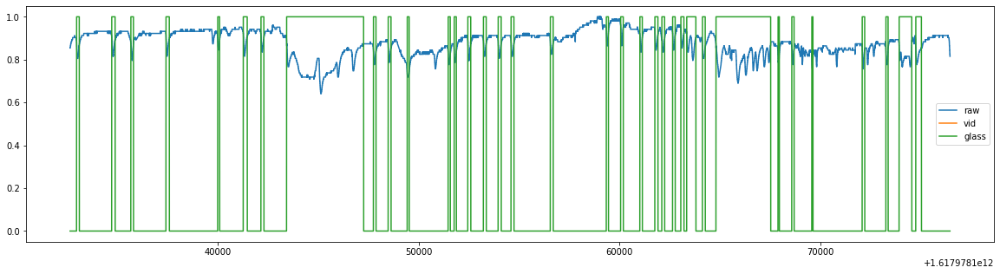

session is 43.799 sec, so we expect 33.49035962281486 blinks.


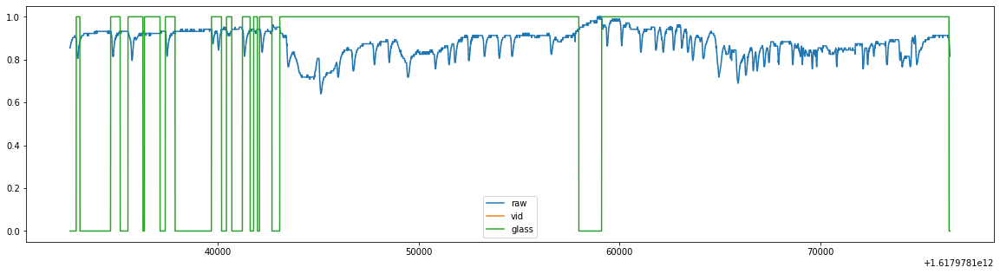

session is 43.799 sec, so we expect 33.49035962281486 blinks.


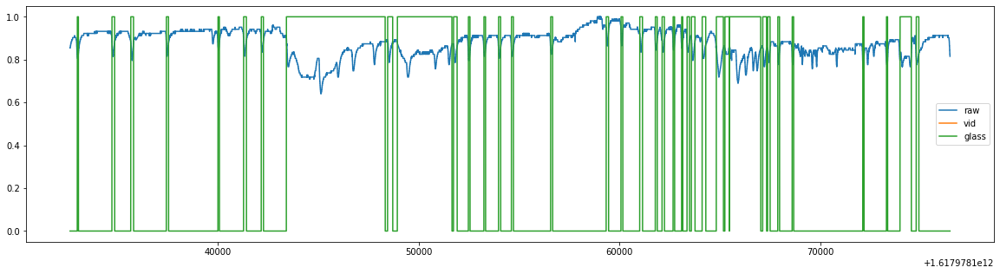

session is 43.799 sec, so we expect 33.49035962281486 blinks.


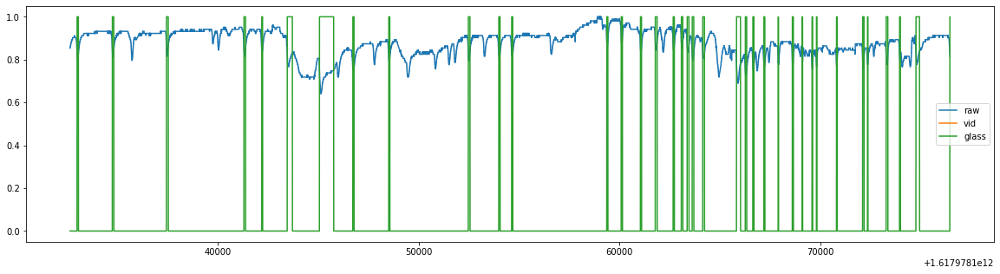

session is 43.799 sec, so we expect 33.49035962281486 blinks.


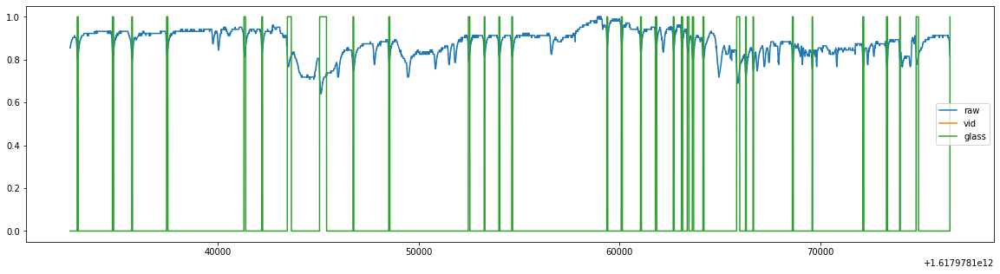

session is 43.799 sec, so we expect 33.49035962281486 blinks.


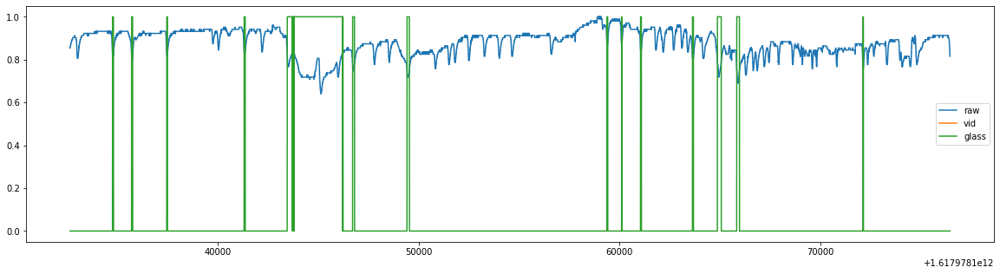

session is 43.799 sec, so we expect 33.49035962281486 blinks.


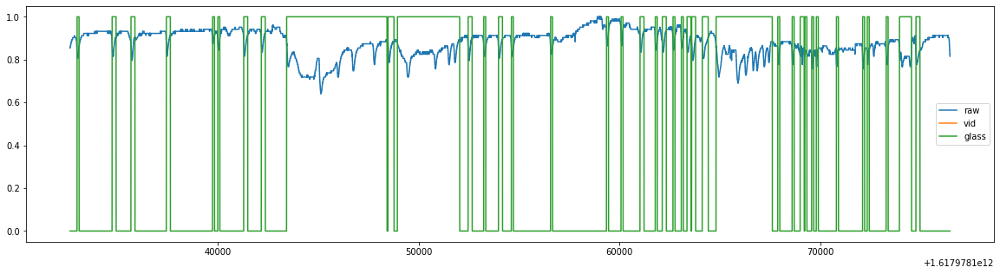

session is 43.799 sec, so we expect 33.49035962281486 blinks.


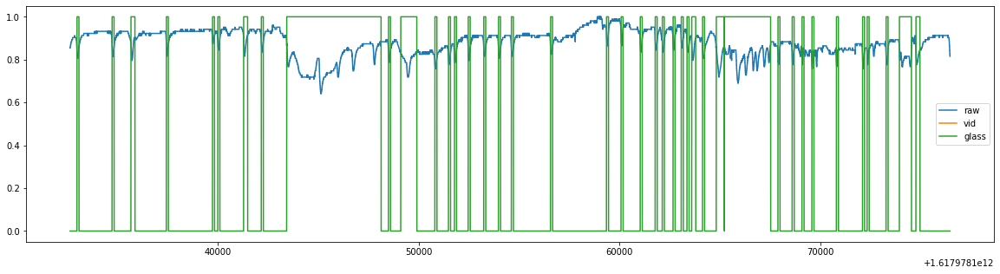

session is 43.799 sec, so we expect 33.49035962281486 blinks.


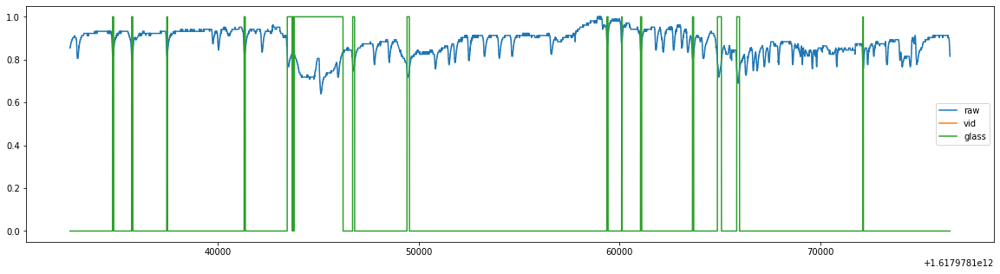

In [174]:
def plot_performance(sess,
                     func_and_args,
                     df_vid=None,
                     sess_start_min=2,
                     sess_max_dur_min=10):
    try:
        test_sess = sess.iloc[60*60*sess_start_min:60*60*(sess_start_min+sess_max_dur_min)]
    except:
        test_sess = sess
        
    sess_dur = test_sess['timestamp_ms'].iloc[-1] - test_sess['timestamp_ms'].iloc[0]
    sess_dur /= 1000.
    target = sess_dur * vid_meta_data['blinks_per_sec']
    print('session is', sess_dur, 'sec, so we expect', target, 'blinks.')
    
    fig, ax = plt.subplots(figsize=(20,5))
    ax.plot(test_sess['timestamp_ms'], test_sess['value']/max(test_sess['value']), label='raw')
    if df_vid is not None:
        df_vid = df_between_timestamps(df_vid, 'timestamp_ms',  test_sess['timestamp_ms'].iloc[0], test_sess['timestamp_ms'].iloc[-1])
        vid_sig = []
        for i, row in df_vid.iterrows():
            if row['success']: vid_sig.append(row['AU45_c'])
            else: vid_sig.append(np.nan)
                
        ax.plot(df_vid['timestamp_ms'], vid_sig, label='vid')
        
    glass_sig = func_and_args[0](test_sess, False, *func_and_args[1:])
    ax.plot(test_sess['timestamp_ms'], glass_sig, label='glass')
    ax.legend()
    plt.show()
    
#vid_sess is video sessions
#new_df_vid is df_vid plus time alignment

best_performers = [
 [blink_thresh_LPF_nonrealtime, 100, 100, 3],
 [blink_thresh_LPF_nonrealtime, 100, 500, 0.5],
 [blink_thresh_LPF_nonrealtime, 100, 1000, 5],
 [blink_thresh_LPF, 50, 5],
 [blink_thresh_LPF, 100, 7],
 [blink_thresh_LPF, 1000, 10],
 [blink_thresh, 1000, 5 ,5,100],
 [blink_thresh, 500, 5, 25, 100],
 [blink_thresh, 1000, 10, 2, 20]
]

#I count about 53 +-5 blinks here

for p in best_performers:
    plot_performance(blink_sess[0], p, new_df_vid, 2, 12)

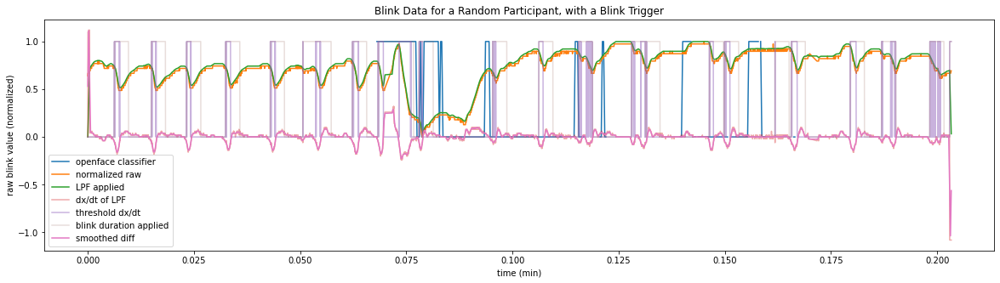

In [299]:
def plot_raw(sess,
             df_vid = None,
             der_avg = 5,
             thresh = .1,
             sess_start_min=2,
             sess_max_dur_min=10,
             blink_dur_ms=300
            ):
    try:
        test_sess = sess.iloc[int(60*1000*sess_start_min):int(60*1000*(sess_start_min+sess_max_dur_min))]
    except:
        test_sess = sess
       
    def moving_average(x, w):
        return np.convolve(x, np.ones(w), 'same') / w
    
    sess_dur = test_sess['timestamp_ms'].iloc[-1] - test_sess['timestamp_ms'].iloc[0]
    sess_dur /= 1000.
    target = sess_dur * vid_meta_data['blinks_per_sec']
    
    fig, ax = plt.subplots(figsize=(20,5))
        
    if df_vid is not None:
        df_vid = df_between_timestamps(df_vid, 'timestamp_ms',  test_sess['timestamp_ms'].iloc[0], test_sess['timestamp_ms'].iloc[-1])
        vid_sig = []
        for i, row in df_vid.iterrows():
            if row['success']: vid_sig.append(row['AU45_c'])
            else: vid_sig.append(np.nan)
                
        ax.plot((df_vid['timestamp_ms'] - test_sess['timestamp_ms'].iloc[0])/60000, vid_sig, label='openface classifier')
        
    
    ax.plot((test_sess['timestamp_ms'] - test_sess['timestamp_ms'].iloc[0])/60000, (test_sess['value'] - min(test_sess['value']))/(max(test_sess['value']) - min(test_sess['value'])), label='normalized raw')
        
    smoothed = moving_average(test_sess['value'], der_avg)
    ax.plot((test_sess['timestamp_ms'] - test_sess['timestamp_ms'].iloc[0])/60000, (smoothed- min(smoothed))/(max(smoothed)-min(smoothed)), label='LPF applied')
    first_der = np.append([0], np.diff(smoothed))
    
    ax.plot((test_sess['timestamp_ms'] - test_sess['timestamp_ms'].iloc[0])/60000, first_der, label='dx/dt of LPF', alpha=0.4)
    
    decision = (first_der < -1*thresh)
    ax.plot((test_sess['timestamp_ms'] - test_sess['timestamp_ms'].iloc[0])/60000, decision, label='threshold dx/dt', alpha=0.5)
    
    blink = []
    samples_per_blink = int((blink_dur_ms / 1000) * 1000) ## 300 ms / 1000ms/s * fps
    i=0
    while i<len(decision):
        if decision[i]:
            blink.extend([1]*samples_per_blink)
            i += samples_per_blink
        else: 
            blink.append(0)
            i += 1
    if len(blink)>len(decision): blink = blink[:len(decision)]
    
    ax.plot((test_sess['timestamp_ms'] - test_sess['timestamp_ms'].iloc[0])/60000, blink, label='blink duration applied', alpha=0.2)
    
    smoothing_diff_samples = 25
    smoothed_diff = moving_average(first_der, smoothing_diff_samples)
    ax.plot((test_sess['timestamp_ms'] - test_sess['timestamp_ms'].iloc[0])/60000, smoothed_diff, label='smoothed diff')
    
    
    ax.set_xlabel('time (min)')
    ax.set_ylabel('raw blink value (normalized)')
    ax.set_title('Blink Data for a Random Participant, with a Blink Trigger')
    ax.legend()
    
    #plt.savefig('blinkdata_juliana2.png', dpi=500)
    plt.show()

    
plot_raw(blink_sess[3],new_df_vid,50,.06,6.1,.2, 200)

#55 is the 'right answer' I think



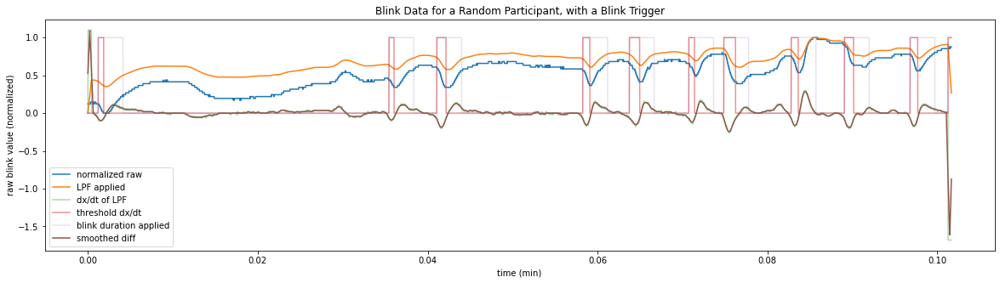

In [300]:
plot_raw(blink_sess[0],None,50,.07,1.1,.1,175)

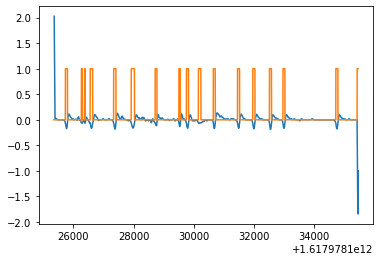

<ipython-input-326-870a665e1a69>:73: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  blink_sess['blink_signal'] = 0
/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

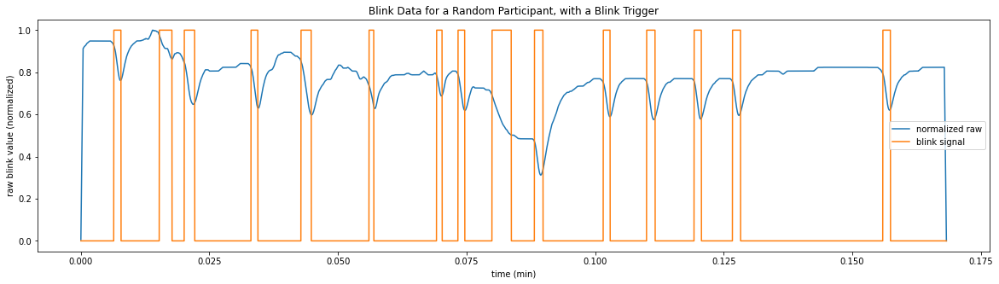

In [326]:
#this should work well --
# we need 25 samples into the future to do the process for now, so about 25 ms after the blink is complete.
# (1) LPF incoming signal, 25 in past and 25 in future
# (2) Take the difference of that with the previous
# (3) LPF this signal with 12 in past and 12 in future
# (4) check if it's lower than a given threshold.  If so, it's a blink.
# (5) start tracking at that point for the lowest value and the highest value, as well as their timestamps, for the next 175 ms.
# (6) capture lowest and highest derivative values.  Their time difference is a clean value proportional to blink duration.  These two values are blink velocity.
# (7) we now have blink yes/no, velocity close, velocity open, duration.  We require 4/5 pieces of data to run this algorithm -- LPF size for input, LPF size for derivative, threshold, blink_duration, reverse (assumption blink signal is low to high rather than high to low).

#we may not need to use the LPF on the derivative.

#we want to allow for half blink/double blinks, where there may not be a full recovery.  We should only debounce blink_dur/2, though we search for peaks for blink_dur

def grab_blinks(blink_sess, thresh=0.06, blink_dur_ms=175, lpf_samples=50, dx_lpf_samples=25, reverse=False):
    #get array of (1)timestamps of blinks, (2) [peak close velocity, peak open velocity], (3) duration
    
    def moving_average(x, w):
        return np.convolve(x, np.ones(w), 'same') / w
    
    #step 1: LPF input, take derivative, LPF derivative
    smooth_input = moving_average(blink_sess['value'], lpf_samples)
    dx = np.append([np.nan], np.diff(smooth_input))
    smooth_dx = moving_average(dx, dx_lpf_samples)
    df_results = pd.DataFrame({'timestamp_ms':blink_sess['timestamp_ms'], 'dx':smooth_dx})
    
    #step 2, apply threshold
    if reverse:
        decision = (smooth_dx > thresh)
    else:
        decision = (smooth_dx < -1*thresh)

    plt.plot(df_results['timestamp_ms'], df_results['dx'])
    plt.plot(df_results['timestamp_ms'], decision)
    plt.show()
    #step 3, use this thresholded value to decide if we are blinking subject to debounce.
    #grab the blink time. within the bounds of the blink, find the duration and peak velocities using the derivative.
    df_blinks = pd.DataFrame()
    samples_per_blink = int(blink_dur_ms)  # happen to sample at 1kHz so 1 sample == 1 ms
    samples_blink_debounce = int(samples_per_blink/2)
    i, blinkrow = 0, {}
    while i<len(decision):
        if decision[i]: #we have a blink
            blinkrow['timestamp_ms'] = df_results['timestamp_ms'].iloc[i] #timestamp of this blink
            
            df_thisblink = df_results.iloc[i:i+samples_per_blink] #grab the data associated with this blink
            if reverse:
                max_close = df_thisblink[df_thisblink['dx'] == df_thisblink['dx'].max()]
                max_open  = df_thisblink[df_thisblink['dx'] == df_thisblink['dx'].min()]
            else:
                max_close = df_thisblink[df_thisblink['dx'] == df_thisblink['dx'].min()]
                max_open  = df_thisblink[df_thisblink['dx'] == df_thisblink['dx'].max()]
            
            blinkrow['vel_close'] = abs(max_close['dx'].iloc[0]) #peak close velocity
            blinkrow['vel_open']  = abs(max_open['dx'].iloc[-1]) #peak open velocity
            blinkrow['duration_ms'] = max_open['timestamp_ms'].iloc[-1] - max_close['timestamp_ms'].iloc[0] #duration
            
            df_blinks = df_blinks.append(blinkrow, ignore_index=True)
            i += samples_blink_debounce #move ahead debounce samples before checking for blinks again
        else: i += 1
            
    return df_blinks

def plot_df_blinks_over_session(df_blinks, blink_sess, lpf_samples=50):
    fig, ax = plt.subplots(figsize=(20,5))
    
    def moving_average(x, w):
        return np.convolve(x, np.ones(w), 'same') / w
    
    smooth_sess = moving_average(blink_sess['value'], lpf_samples)
    ax.plot((blink_sess['timestamp_ms'] - blink_sess['timestamp_ms'].iloc[0])/60000, (smooth_sess - min(smooth_sess))/(max(smooth_sess) - min(smooth_sess)), label='normalized raw')
       
    blink_sess['blink_signal'] = 0
    for i, row in df_blinks.iterrows():
        blink_sess.loc[((int(row['timestamp_ms']) <= blink_sess['timestamp_ms']) & (blink_sess['timestamp_ms'] <= int(row['timestamp_ms'] + row['duration_ms']))), 'blink_signal'] = 1
    
    ax.plot((blink_sess['timestamp_ms'] - blink_sess['timestamp_ms'].iloc[0])/60000, blink_sess['blink_signal'], label='blink signal')
    
    ax.set_xlabel('time (min)')
    ax.set_ylabel('raw blink value (normalized)')
    ax.set_title('Blink Data for a Random Participant, with a Blink Trigger')
    ax.legend()
    
    #plt.savefig('blinkdata_juliana2.png', dpi=500)
    plt.show()
    
df_blinks = grab_blinks(blink_sess[0].iloc[:10000],blink_dur_ms=250)
plot_df_blinks_over_session(df_blinks, blink_sess[0].iloc[:10000])

In [341]:
#now look and see how well we line up by comparing just the sections that match
#iterate over glasses section, all video sections within--
# num counted glass, num counted blink -- true positive, real positive, false positive

#1 iterate over video sections
#2 find the relevant glasses section
#3 compare times and add to hit rates with some threshold

'''
vid_meta_data = {}
vid_meta_data['total_frames'] = total
vid_meta_data['successful_frames'] = successful
vid_meta_data['percent_successful'] = 100.*successful/total
vid_meta_data['total_duration_sec'] = total/60.
vid_meta_data['session_min_sec'] = MIN_SEC_SESSION
vid_meta_data['session_drop_frames'] = DROP_FRAMES
vid_meta_data['num_sessions'] = len(vid_sess)
vid_meta_data['session_times'] = [[s['timestamp_ms'].iloc[0], s['timestamp_ms'].iloc[-1]] for s in vid_sess]
vid_meta_data['duration_sessions_sec'] = [(s['timestamp_ms'].iloc[-1] - s['timestamp_ms'].iloc[0])/1000. for s in vid_sess]
vid_meta_data['session_total_sec'] = sum(vid_meta_data['duration_sessions_sec'])
vid_meta_data['blinks_per_session'] = [count_rising_edges(s, 'AU45_c') for s in vid_sess]
vid_meta_data['blink_timestamps_per_session'] = [rising_edge_times(s, 'AU45_c', 'timestamp_ms') for s in vid_sess]
vid_meta_data['total_blinks'] = sum(vid_meta_data['blinks_per_session'])
vid_meta_data['blinks_per_sec'] = vid_meta_data['total_blinks'] / vid_meta_data['session_total_sec']
'''

def get_all_blink_sessions(blink_sessions, thresh=0.06, blink_dur_ms=250, lpf_samples=50, dx_lpf_samples=25, reverse=False):
    
    df_result = pd.DataFrame()
    for sess in blink_sessions:
        df_blinks = grab_blinks(sess,
                                thresh=thresh, 
                                blink_dur_ms=blink_dur_ms, 
                                lpf_samples=lpf_samples, 
                                dx_lpf_samples=dx_lpf_samples, 
                                reverse=reverse)
        df_result = df_result.append(df_blinks, ignore_index=True)
        
    return df_result

def get_stats_glasses_vs_video(vid_meta_data, df_blinks, tolerance_ms=250):
    results = {'true_pos':0, 'false_pos':0, 'real_pos':0}
    #real pos should equal vid_meta_data['total_blinks'] by the end
    
    for i in range(vid_meta_data['num_sessions']):
        glasses_blink_in_sess = df_between_timestamps(df_blinks, 'timestamp_ms', vid_meta_data['session_times'][i][0]-tolerance_ms, vid_meta_data['session_times'][i][1]+tolerance_ms)
        g_blink_times = glasses_blink_in_sess['timestamp_ms'].tolist()
        v_blink_times = vid_meta_data['blink_timestamps_per_session'][i]
        #print('-'*20)
        #print(g_blink_times)
        #print(v_blink_times)
        
        results['real_pos'] += len(v_blink_times)
        for  vtime in v_blink_times:
            for gtime in g_blink_times:
                if vtime-tolerance_ms <= gtime <= vtime+tolerance_ms:
                    #print('hit!',vtime,':',gtime)
                    results['true_pos'] += 1
                    g_blink_times.remove(gtime)
                    break
        g_blink_times = [t for t in g_blink_times if vid_meta_data['session_times'][i][0] < t <= vid_meta_data['session_times'][i][1]]
        results['false_pos'] += len(g_blink_times)
        #print(results)

    results['sensitivity'] = results['true_pos'] / results['real_pos'] * 100
    results['false_discovery'] = results['false_pos'] / (results['false_pos'] + results['true_pos']) * 100
    
    return results
    
# sensitivity/hit rate = true positive / real positives
# false discovery rate = false positive / (false positive + true positive)

In [342]:
#get all blinks from all glasses blink sessions in one df
#df_all_glasses_blinks = get_all_blink_sessions(blink_sess)

#compare
results = get_stats_glasses_vs_video(vid_meta_data, df_all_glasses_blinks)
print(results)

{'true_pos': 258, 'false_pos': 766, 'real_pos': 849, 'sensitivity': 30.3886925795053, 'false_discovery': 74.8046875}


# Mapping our quaternions to radians in world coordinates at different sample rates

Our part gives us real part plus the imaginary components (all 4), but the magnitude of these we expect to equal 1 (it is not describing a rotation, as is typical for quaternions, but just a 3D orientation).  The same is true of the video quaternions, which don't bother to include the real part since we know it will sum to 1 with the others in magnitude.

The video is at 60Hz, our time aligned data is at 10Hz.  We want to quickly map one to the other to check for quality.

(1) interpolate 60Hz signal to nearest 10Hz.
(2) find a LMS quaternion to mulitply by one of our datasets to give the other
(3) apply it, plot the result, plot the magnitude error at each timestep

In [510]:
#we have accel_sess and vid_sess

def align_accel_into_vid(accel_sess, vid_sess):
    #let's accumulate our 10hz accel data into one df
    df_all_accel = pd.concat(accel_sess)
    
    pd.options.mode.chained_assignment = None  # default='warn'
    
    combined_dfs = []
    #now we'll make an array for each vid session
    for v in vid_sess:
        #grab accel in that vid_sess
        a = df_between_timestamps(df_all_accel, 
                                  'timestamp_ms', 
                                  v['timestamp_ms'].iloc[0], 
                                  v['timestamp_ms'].iloc[-1])
        #now for each a, interpolate v and append
        for i, row in a.iterrows():
            interpolate_time = row['timestamp_ms']
            v['diff'] = v['timestamp_ms'] - interpolate_time
            
            v_prior = v[v['diff'] == v.loc[v['diff']<=0, 'diff'].max()]
            v_after = v[v['diff'] == v.loc[v['diff']>=0, 'diff'].min()]
            
            weight_prior = abs(v_after['diff'].values[0])
            weight_after = abs(v_prior['diff'].values[0])

            if weight_prior == 0:
                weight_prior = 0
                weight_after = 1
            elif weight_after == 0:
                weight_prior = 1
                weight_after = 0
            else:
                total = weight_prior + weight_after
                weight_prior /= total
                weight_after /= total

            a.loc[i, 'vid_Rx'] = weight_prior*v_prior['pose_Rx'].values[0] + \
                          weight_after*v_after['pose_Rx'].values[0]
            a.loc[i, 'vid_Ry'] = weight_prior*v_prior['pose_Ry'].values[0] + \
                          weight_after*v_after['pose_Ry'].values[0]
            a.loc[i, 'vid_Rz'] = weight_prior*v_prior['pose_Rz'].values[0] + \
                          weight_after*v_after['pose_Rz'].values[0]

                    
                    
        combined_dfs.append(a)
    
    pd.options.mode.chained_assignment = 'warn'
    
    return combined_dfs
        
quat_dfs = align_accel_into_vid(accel_sess, vid_sess)

A simple test to map the glasses frame to the video frame, just using the first timestamp data:

In [520]:
from scipy.spatial.transform import Rotation as R

def test_transform(quat_dfs):
    df_flat = pd.concat(quat_dfs)
    
    rot_vid = R.from_rotvec([df_flat.iloc[0][['vid_Rx', 'vid_Ry', 'vid_Rz']].tolist()])
    rot_glass = R.from_quat([df_flat.iloc[0][['quatReal', 'quatI', 'quatJ', 'quatK']].tolist()])
    
    # Ax = B  |  rot_glass * x = rot_vid  |  x = B/A = A^-1 * B
    x = rot_glass.inv() * rot_vid
    
    print('          glass:', rot_glass.as_euler('xyz', degrees=True))
    print('      transform:', x.as_euler('xyz', degrees=True))
    print('                --------')
    print('glass*transform:', (rot_glass*x).as_euler('xyz', degrees=True))
    print('          video:', rot_vid.as_euler('xyz', degrees=True))

def test_transform_array(quat_dfs):
    df_flat = pd.concat(quat_dfs)
    
    rot_vid = R.from_rotvec(df_flat.iloc[0:10][['vid_Rx', 'vid_Ry', 'vid_Rz']])
    rot_glass = R.from_quat(df_flat.iloc[0:10][['quatReal', 'quatI', 'quatJ', 'quatK']])
    
    # Ax = B  |  rot_glass * x = rot_vid  |  x = B/A = A^-1 * B
    x = (rot_glass.inv() * rot_vid).mean()
    
    for i in range(10):
        print('--')
        print('glass*transform:', (rot_glass[i]*x).as_euler('xyz', degrees=True))
        print('            vid:', rot_vid[i].as_euler('xyz', degrees=True))
    
    
    
test_transform(quat_dfs)
test_transform_array(quat_dfs)

          glass: [[-43.52455143  66.21203339  15.85362799]]
      transform: [[ 38.99171208 -21.61056604 -48.44863329]]
                --------
glass*transform: [[-25.27385132  15.26601253   0.78224545]]
          video: [[-25.27385132  15.26601253   0.78224545]]
--
glass*transform: [-28.7029313   15.10721241   1.30123606]
            vid: [-25.27385132  15.26601253   0.78224545]
--
glass*transform: [-29.02409103  15.75913573  -0.66459808]
            vid: [-25.95838898  18.89488122   2.84037487]
--
glass*transform: [-28.658763    15.33879323  -0.34004524]
            vid: [-29.85366033  18.43810104   3.43833844]
--
glass*transform: [-29.12455581  14.75642974  -0.11522246]
            vid: [-25.91261833  15.0119271    1.9198579 ]
--
glass*transform: [-28.59932314  13.83770767   0.23821837]
            vid: [-26.64955231  15.07459761   1.5733779 ]
--
glass*transform: [-29.00461593  12.6107786   -1.51273574]
            vid: [-26.36513151  15.01244901   1.09778452]
--
glass*transform: [

Now we try to do it in a LMS way over all glasses rotations and video rotations

In [556]:
def apply_transform(quat_df_array, by_session=True, technique='avg'):
    
    if not by_session:
        df_flatten = pd.concat(quat_df_array)
        rot_vid   = R.from_rotvec(df_flatten[['vid_Rx', 'vid_Ry', 'vid_Rz']])
        rot_glass = R.from_quat(df_flatten[['quatReal', 'quatI', 'quatJ', 'quatK']])
        # Ax = B  |  rot_glass * x = rot_vid  |  x = B/A = A^-1 * B
        rot_transforms = (rot_glass.inv() * rot_vid)
        
        #should apply to vector [1,0,0] to see what it looks like when plotting rotations
        test_vec = [[1,0,0]]*len(rot_transforms)        
        fig = plt.figure(figsize=(8,8))
        ax = plt.axes(projection='3d')
        data = rot_transforms.apply(test_vec)
        print(data.shape)
        ax.scatter3D(data[:,0], data[:,1], data[:,2], alpha=.2)
        
        Transform_1 = rot_transforms.mean()
        t1 = Transform_1.apply(test_vec[0])
        ax.plot3D([0,t1[0]], [0,t1[1]], [0,t1[2]], linewidth=3, label = 'transform 1', color='green')
        
        Transform_2 = R.align_vectors(rot_vid.apply(test_vec), rot_glass.apply(test_vec))
        t2 = Transform_2[0].apply(test_vec[0])
        ax.plot3D([0,t2[0]], [0,t2[1]], [0,t2[2]], linewidth=3, label = 'transform 2', color='red')
        plt.show()
        
        if technique=='avg': Transform = Transform_1
        else: Transform = Transform_2[0]
        
    for i in range(len(quat_df_array)):
        
        try:
            if by_session:
                rot_vid   = R.from_rotvec(quat_df_array[i][['vid_Rx', 'vid_Ry', 'vid_Rz']])
                rot_glass = R.from_quat(quat_df_array[i][['quatReal', 'quatI', 'quatJ', 'quatK']])
                # Ax = B  |  rot_glass * x = rot_vid  |  x = B/A = A^-1 * B
                if technique=='avg':
                    Transform = (rot_glass.inv() * rot_vid).mean()
                else:
                    test_vec = [[1,0,0]]*len(rot_vid)
                    Transform = R.align_vectors(rot_vid.apply(test_vec), rot_glass.apply(test_vec))[0]
        
            def apply_quat(row):
                return (R.from_quat(row[['quatReal', 'quatI','quatJ', 'quatK']].tolist())*Transform).as_euler('xyz').tolist()

            quat_results = pd.DataFrame(quat_df_array[i].apply(apply_quat, axis=1).to_list(), columns = ['glasses_Rx', 'glasses_Ry', 'glasses_Rz'])

            quat_df_array[i].reset_index(drop=True, inplace=True)
            quat_df_array[i] = pd.concat([quat_df_array[i], quat_results], axis=1)
        except:
            print('failed for #',i,'in quat_array. Len samples:', len(quat_df_array[i]))
    return quat_df_array


temp_quat_dfs = quat_dfs.copy()
new_quat_dfs = apply_transform(temp_quat_dfs, by_session=True)

failed for # 383 in quat_array. Len samples: 0
failed for # 384 in quat_array. Len samples: 0
failed for # 385 in quat_array. Len samples: 0
failed for # 386 in quat_array. Len samples: 0
failed for # 387 in quat_array. Len samples: 0
failed for # 388 in quat_array. Len samples: 0
failed for # 389 in quat_array. Len samples: 0
failed for # 390 in quat_array. Len samples: 0
failed for # 391 in quat_array. Len samples: 0
failed for # 392 in quat_array. Len samples: 0
failed for # 393 in quat_array. Len samples: 0
failed for # 394 in quat_array. Len samples: 0
failed for # 395 in quat_array. Len samples: 0
failed for # 396 in quat_array. Len samples: 0
failed for # 397 in quat_array. Len samples: 0
failed for # 398 in quat_array. Len samples: 0
failed for # 399 in quat_array. Len samples: 0
failed for # 400 in quat_array. Len samples: 0
failed for # 401 in quat_array. Len samples: 0
failed for # 402 in quat_array. Len samples: 0
failed for # 403 in quat_array. Len samples: 0
failed for # 

In [557]:
new_quat_dfs[0].head()

,timestamp_ms,quatI,quatJ,quatK,quatReal,quatRadianAccuracy,vid_Rx,vid_Ry,vid_Rz,glasses_Rx,glasses_Ry,glasses_Rz
0,1617978216227,-0.459595,-0.307861,-0.742615,0.377563,1.773926,-0.440294,0.259118,0.072118,-0.494961,0.316839,0.091537
1,1617978216326,-0.470764,-0.296509,-0.743896,0.370239,1.774170,-0.457000,0.313000,0.123000,-0.499820,0.328562,0.057178
2,1617978216427,-0.466370,-0.298035,-0.746155,0.369995,1.774170,-0.526000,0.299000,0.142000,-0.493887,0.320821,0.063026
3,1617978216527,-0.462646,-0.296570,-0.746155,0.375854,1.774414,-0.454000,0.250000,0.092000,-0.502860,0.311219,0.066272
4,1617978216627,-0.454590,-0.297058,-0.750916,0.375793,1.774658,-0.466000,0.252000,0.088000,-0.494723,0.294615,0.072604


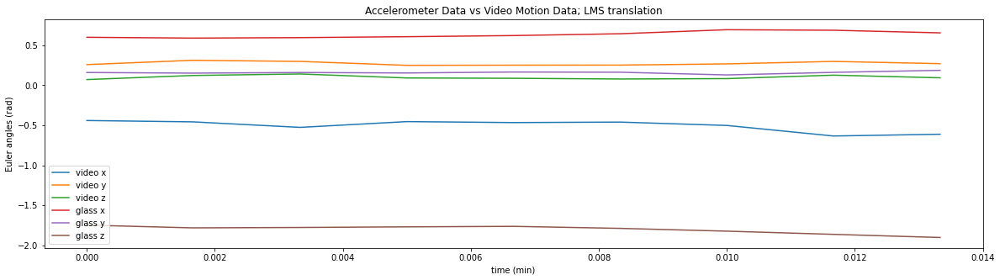

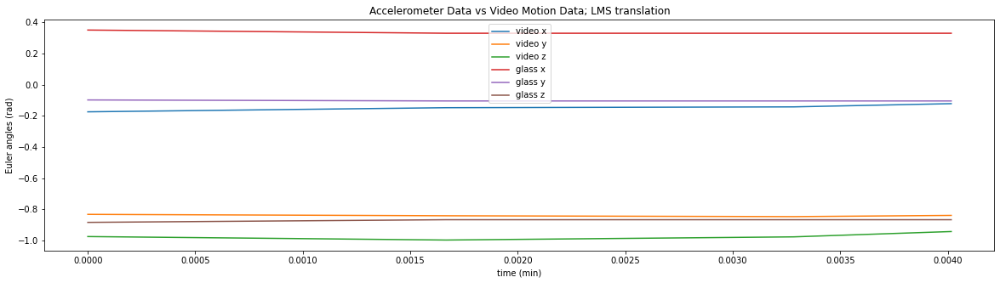

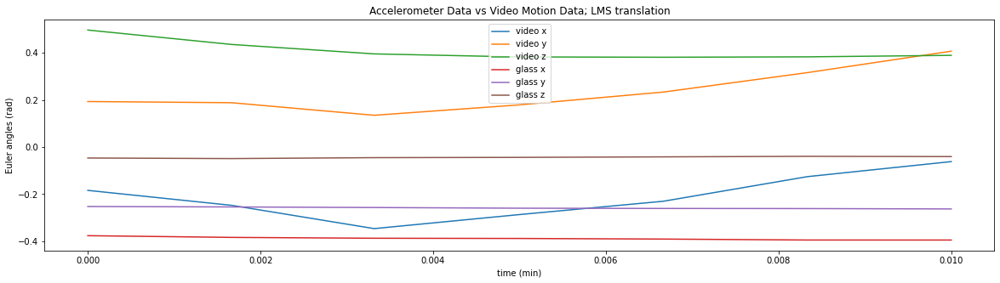

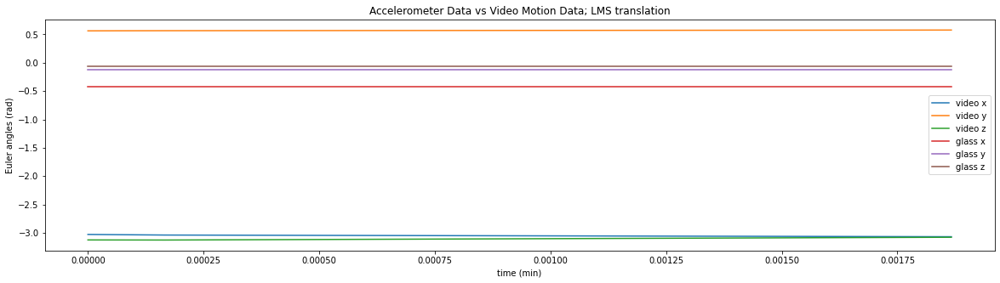

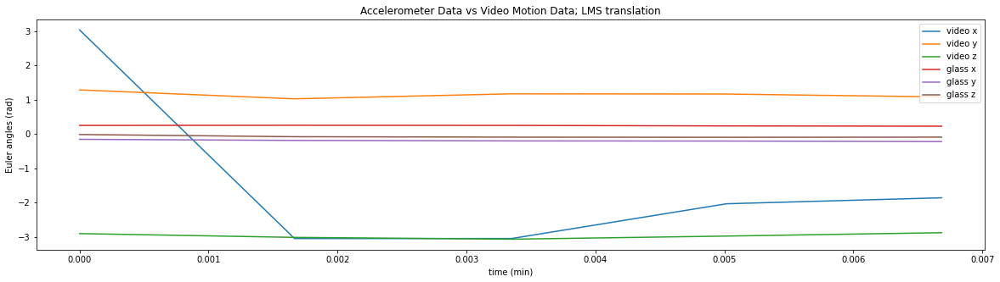

...

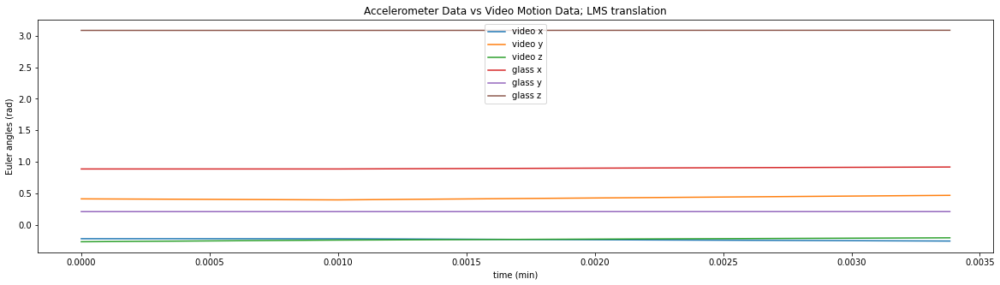

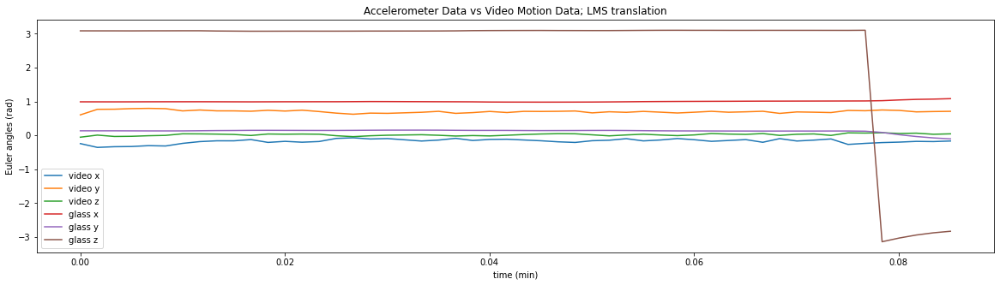

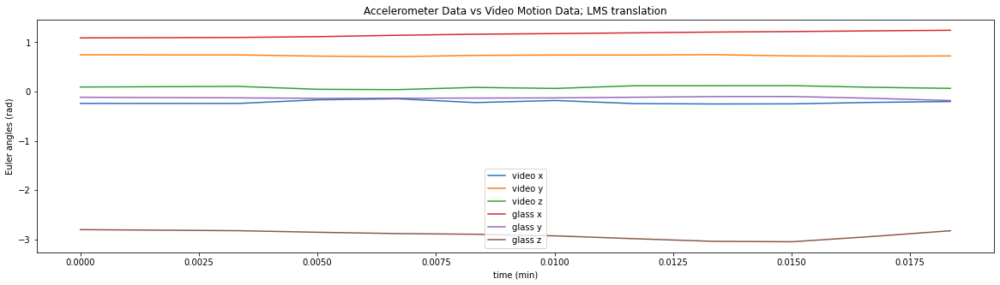

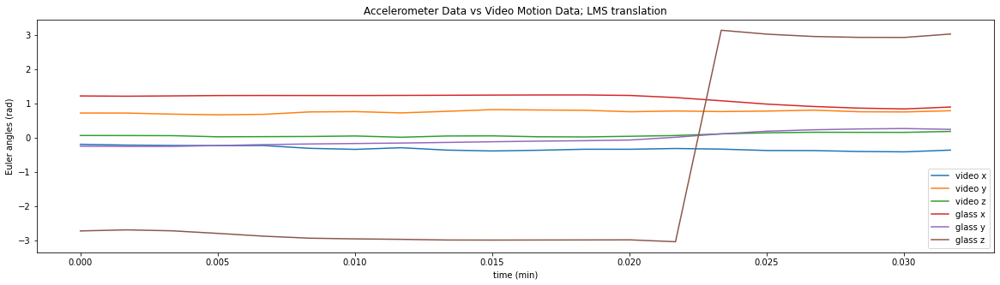

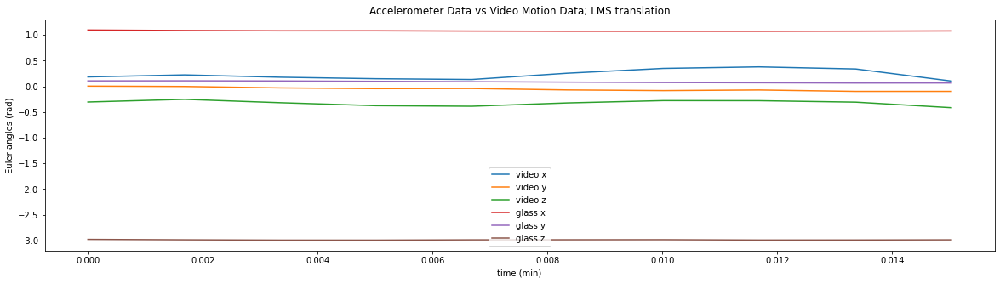

IndexError: single positional indexer is out-of-bounds

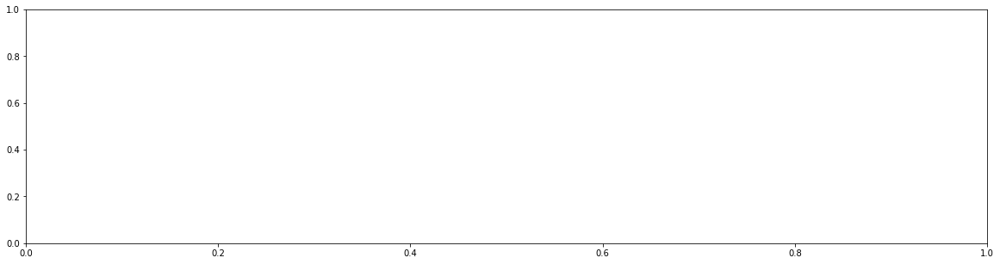

In [558]:
for sess in new_quant_dfs:
    fig, ax = plt.subplots(figsize=(20,5))
      
    ax.plot((sess['timestamp_ms'] - sess['timestamp_ms'].iloc[0])/60000, sess['vid_Rx'], label='video x')
    ax.plot((sess['timestamp_ms'] - sess['timestamp_ms'].iloc[0])/60000, sess['vid_Ry'], label='video y')
    ax.plot((sess['timestamp_ms'] - sess['timestamp_ms'].iloc[0])/60000, sess['vid_Rz'], label='video z')
    
    ax.plot((sess['timestamp_ms'] - sess['timestamp_ms'].iloc[0])/60000, sess['glasses_Rx'], label='glass x')
    ax.plot((sess['timestamp_ms'] - sess['timestamp_ms'].iloc[0])/60000, sess['glasses_Ry'], label='glass y')
    ax.plot((sess['timestamp_ms'] - sess['timestamp_ms'].iloc[0])/60000, sess['glasses_Rz'], label='glass z')
    
    ax.set_xlabel('time (min)')
    ax.set_ylabel('Euler angles (rad)')
    ax.set_title('Accelerometer Data vs Video Motion Data; LMS translation')
    ax.legend()
    
    #plt.savefig('blinkdata_juliana2.png', dpi=500)
    plt.show()